In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff

import umap
import umap.plot
from umap import UMAP


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder,OneHotEncoder
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score, f1_score, precision_score, recall_score,roc_curve, roc_auc_score
from imblearn.combine import SMOTEENN


from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import model_selection
from sklearn.calibration import LinearSVC
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbPipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform

import warnings
warnings.filterwarnings('ignore', category=Warning)

2024-11-27 11:23:23.691821: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1732677803.710329 1938246 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732677803.715992 1938246 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-27 11:23:23.736900: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/home1/gmh/anaconda3/envs/diabets/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe q

In [ ]:
data = pd.read_csv('./data/diabetes.csv')
data.head().T.style.set_properties(**{'background-color': 'grey',
                           'color': 'white',
                           'border-color': 'white'})

,0,1,2,3,4
Pregnancies,6.000000,1.000000,8.000000,1.000000,0.000000
Glucose,148.000000,85.000000,183.000000,89.000000,137.000000
BloodPressure,72.000000,66.000000,64.000000,66.000000,40.000000
SkinThickness,35.000000,29.000000,0.000000,23.000000,35.000000
Insulin,0.000000,0.000000,0.000000,94.000000,168.000000
BMI,33.600000,26.600000,23.300000,28.100000,43.100000
DiabetesPedigreeFunction,0.627000,0.351000,0.672000,0.167000,2.288000
Age,50.000000,31.000000,32.000000,21.000000,33.000000
Outcome,1.000000,0.000000,1.000000,0.000000,1.000000


In [ ]:
print(f"The dataset has {data.shape[0]} Rows and {data.shape[1]} columns")

The dataset has 768 Rows and 9 columns


In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [ ]:
data.rename(columns ={"DiabetesPedigreeFunction":"DPF"},inplace=True)

<Axes: >

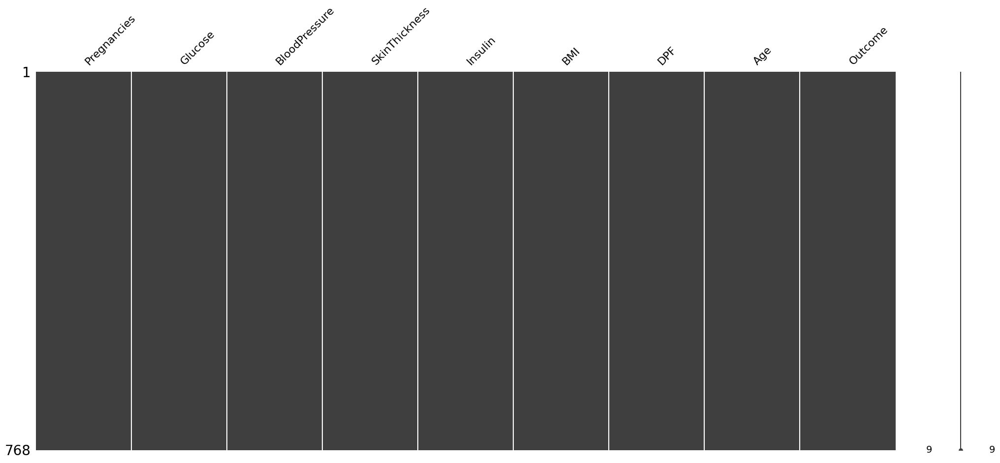

In [ ]:
import missingno as msno
msno.matrix(data)

In [ ]:
duplicate_rows_data = data[data.duplicated()]
print("number of duplicate rows: ", duplicate_rows_data.shape)

data = data.drop_duplicates()

number of duplicate rows:  (0, 9)


In [ ]:
colors = ['purple', 'pink']
labels = ['Non-Diabetes','Diabetes']
values = data['Outcome'].value_counts()/data['Outcome'].shape[0]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(
    title_text="Diabetes Outcome Distribution",)
fig.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Pregnancies', color_discrete_sequence=px.colors.sequential.Bluered_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Pregnancies',color_discrete_sequence=px.colors.sequential.BuPu_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Pregnancies Data Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='rosybrown'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="Pregnancies Distribution",
                   font=dict(size=16, color='deeppink'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Pregnancies Box Plot",
                   font=dict(size=16, color='violet'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Pregnancies",
    showarrow=False,
    font=dict(size=20, color="purple"),
    xref="paper", yref="paper",
    x=.85, y=0.5
)
fig.show()

In [ ]:
pregnancies_summary = data.groupby(['Pregnancies', 'Outcome']).size().reset_index(name='Count')
pregnancies_summary['Outcome'] = pregnancies_summary['Outcome'].replace(0, 'No').replace(1, 'Yes')
fig = px.bar(pregnancies_summary, 
             x='Pregnancies', 
             y='Count', 
             color='Outcome', 
             title='Pregnancies VS Diabetes Outcome',
             text='Count',
             color_discrete_sequence=px.colors.sequential.Sunset_r)
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='dodgerblue'), 
    template='ggplot2',
    barmode='stack',  
    xaxis_title='Pregnancies',
    yaxis_title='Count',
    width=500,
    height=500,
    showlegend=True,
)
fig.show()


In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Glucose', color_discrete_sequence=px.colors.sequential.Agsunset,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Glucose',color_discrete_sequence=px.colors.sequential.Cividis).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Glucose Data Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='mediumaquamarine'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="Glucose Distribution",
                   font=dict(size=16, color='mediumpurple'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Glucose Box Plot",
                   font=dict(size=16, color='khaki'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Glucose",
    showarrow=False,
    font=dict(size=20, color="khaki"),
    xref="paper", yref="paper",
    x=.82, y=0.6
)
fig.show()

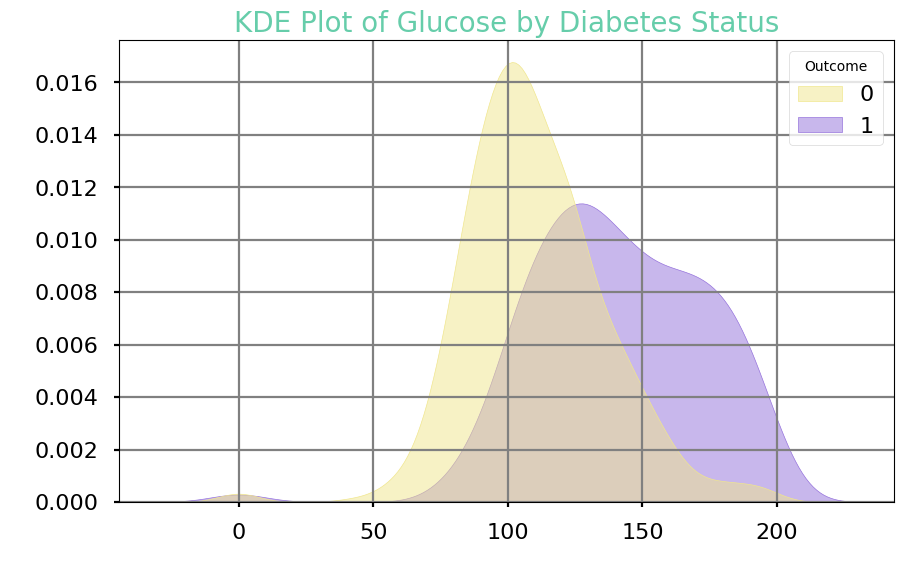

In [ ]:
plt.style.use('seaborn-poster')
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='Glucose', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'mediumpurple', 0: 'khaki'},
             alpha=0.5)
plt.title('KDE Plot of Glucose by Diabetes Status', fontsize=20, color='mediumaquamarine')
plt.xlabel('Glucose', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='BloodPressure', color_discrete_sequence=px.colors.sequential.Plasma,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='BloodPressure',color_discrete_sequence=px.colors.sequential.Peach_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="BloodPressure Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='crimson'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="BloodPressure Distribution",
                   font=dict(size=16, color='dodgerblue'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="BloodPressure Box Plot",
                   font=dict(size=16, color='chocolate'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="BloodPressure",
    showarrow=False,
    font=dict(size=20, color="chocolate"),
    xref="paper", yref="paper",
    x=.85, y=0.6
)
fig.show()

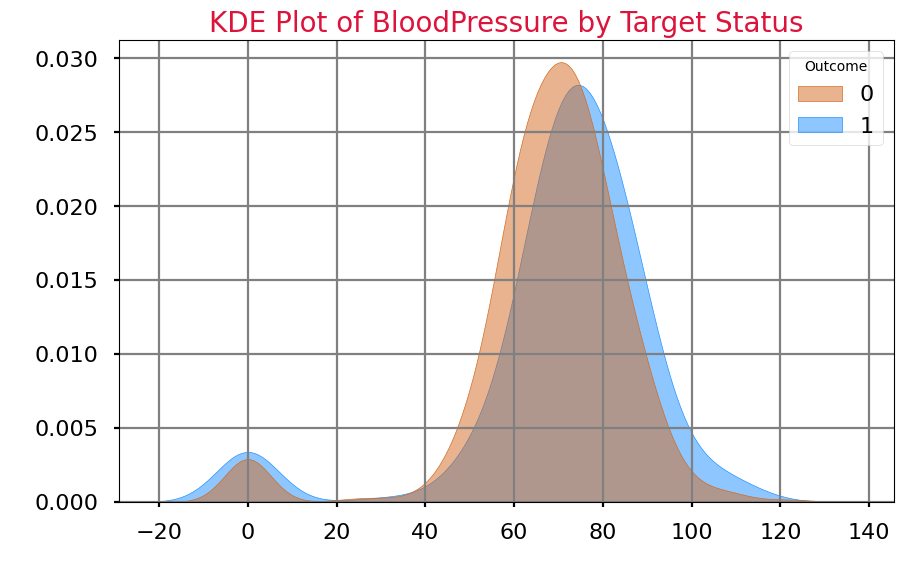

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='BloodPressure', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'dodgerblue', 0: 'chocolate'},
             alpha=0.5)
plt.title('KDE Plot of BloodPressure by Target Status', fontsize=20, color='crimson')
plt.xlabel('BloodPressure', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='SkinThickness', color_discrete_sequence=px.colors.sequential.Inferno_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='SkinThickness',color_discrete_sequence=px.colors.sequential.Oryel_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="SkinThickness Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='aquamarine'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="SkinThickness Distribution",
                   font=dict(size=16, color='blanchedalmond'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                    xanchor='center', yanchor='bottom')

fig.add_annotation(text="SkinThickness Box Plot",
                   font=dict(size=16, color='mediumvioletred'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="SkinThickness",
    showarrow=False,
    font=dict(size=20, color="mediumvioletred"),
    xref="paper", yref="paper",
    x=.85, y=0.25
)
fig.show()

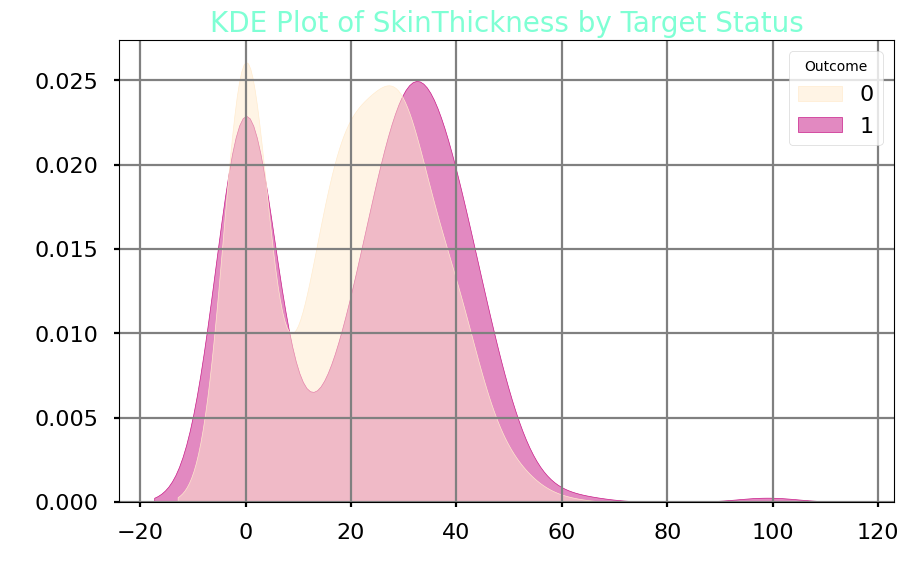

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='SkinThickness', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'mediumvioletred', 0: 'blanchedalmond'},
             alpha=0.5)
plt.title('KDE Plot of SkinThickness by Target Status', fontsize=20, color='aquamarine')
plt.xlabel('SkinThickness', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()


In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Insulin', color_discrete_sequence=px.colors.sequential.Magenta,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Insulin',color_discrete_sequence=px.colors.sequential.Magenta_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Insulin Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='aquamarine'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="Insulin Distribution",
                   font=dict(size=16, color='blanchedalmond'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Insulin Box Plot",
                   font=dict(size=16, color='mediumvioletred'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Insulin",
    showarrow=False,
    font=dict(size=20, color="mediumvioletred"),
    xref="paper", yref="paper",
    x=.82, y=0.08
)
fig.show()

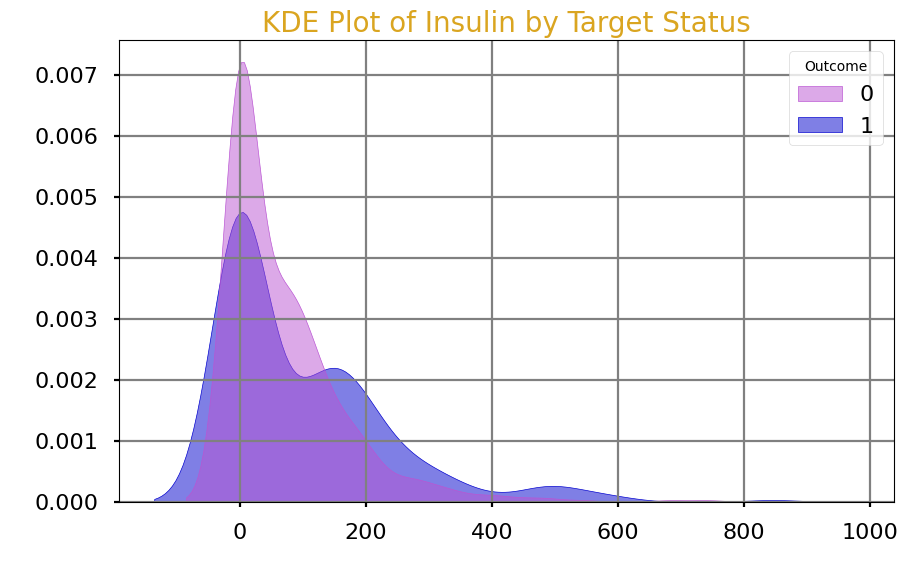

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data, x='Insulin', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'mediumblue', 0: 'mediumorchid'},
             alpha=0.5)
plt.title('KDE Plot of Insulin by Target Status', fontsize=20, color='goldenrod')
plt.xlabel('Insulin', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='BMI', color_discrete_sequence=px.colors.sequential.algae_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='BMI',color_discrete_sequence=px.colors.sequential.GnBu_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="BMI Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='lightpink'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="BMI Distribution",
                   font=dict(size=16, color='forestgreen'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="BMI Box Plot",
                   font=dict(size=16, color='dodgerblue'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="BMI",
    showarrow=False,
    font=dict(size=20, color="dodgerblue"),
    xref="paper", yref="paper",
    x=.8, y=0.5
)
fig.show()


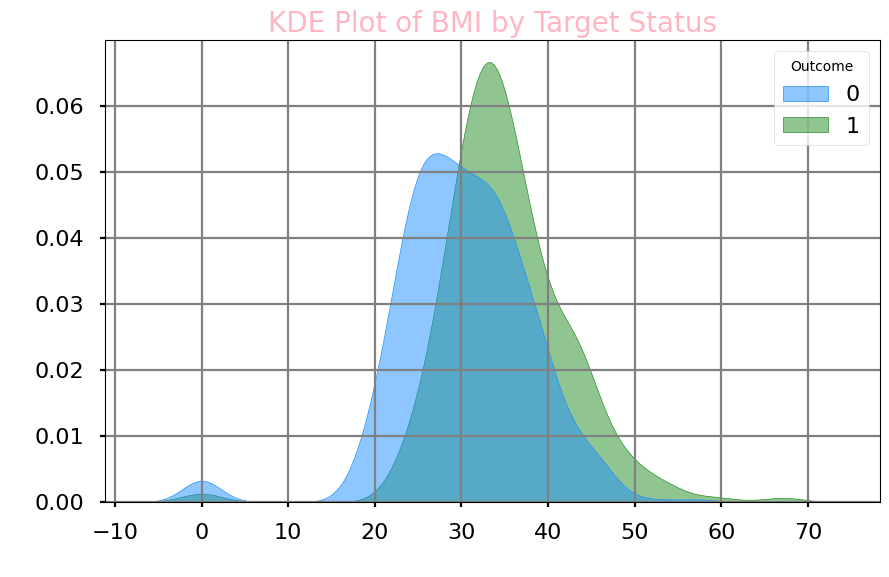

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data,x='BMI', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'forestgreen', 0: 'dodgerblue'},
             alpha=0.5)
plt.title('KDE Plot of BMI by Target Status', fontsize=20, color='lightpink')
plt.xlabel('BMI', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='DPF', color_discrete_sequence=px.colors.sequential.haline_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='DPF',color_discrete_sequence=px.colors.sequential.haline).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="DPF Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='midnightblue'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="DPF Distribution",
                   font=dict(size=16, color='sandybrown'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="DPF Box Plot",
                   font=dict(size=16, color='dodgerblue'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="PedigreeFunction",
    showarrow=False,
    font=dict(size=20, color="dodgerblue"),
    xref="paper", yref="paper",
    x=.88, y=0.15
)
fig.show()

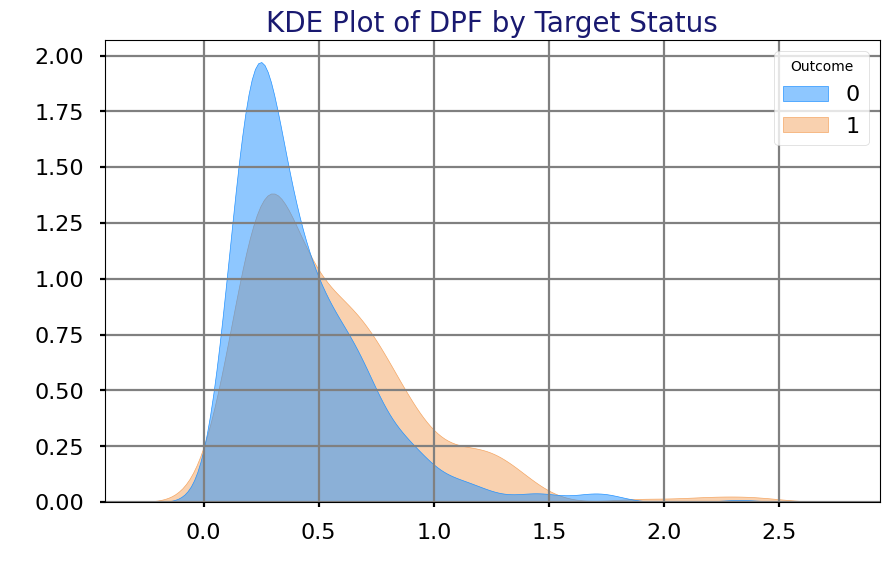

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data,x='DPF', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'sandybrown', 0: 'dodgerblue'},
             alpha=0.5)
plt.title('KDE Plot of DPF by Target Status', fontsize=20, color='midnightblue')
plt.xlabel('DPF', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
    px.histogram(data, x='Age', color_discrete_sequence=px.colors.sequential.Brwnyl_r,text_auto=True).data[0],
    row=1, col=1
)
fig.add_trace(
     px.box(data, y='Age',color_discrete_sequence=px.colors.sequential.Oranges_r).data[0],  
     row=1, col=2
)
fig.update_layout(
    title="Age Analysis",
    title_x=0.5,
    title_font=dict(size=20, color='brown'),
    template="ggplot2",
    width=1000, 
    height=500
)
fig.add_annotation(text="Age Distribution",
                   font=dict(size=16, color='darkred'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=0.23, y=1,  
                   xanchor='center', yanchor='bottom')

fig.add_annotation(text="Age Box Plot",
                   font=dict(size=16, color='darkorange'),
                   showarrow=False,
                   xref="paper", yref="paper",
                   x=.77, y=1, 
                   xanchor='center', yanchor='bottom')
fig.add_annotation(
    text="Age",
    showarrow=False,
    font=dict(size=20, color="darkorange"),
    xref="paper", yref="paper",
    x=.8, y=0.2
)
fig.show()

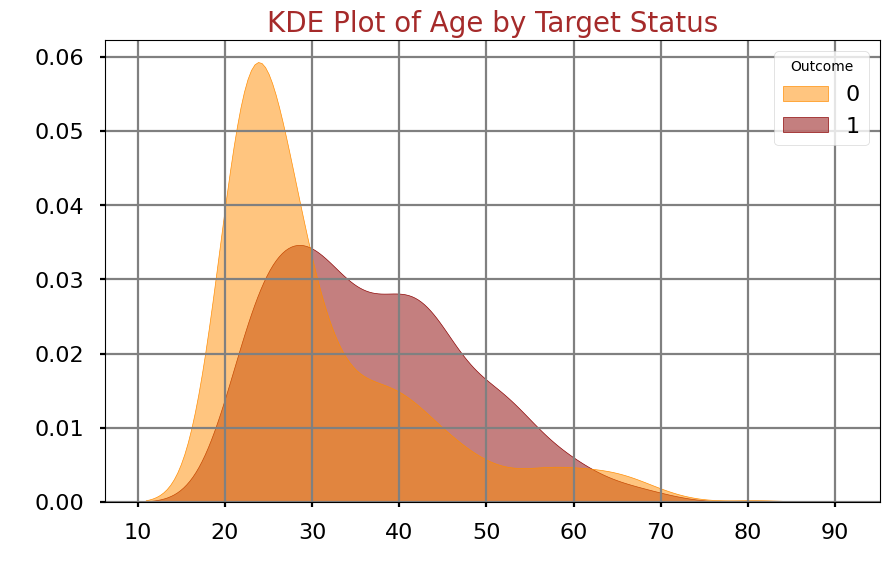

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=data,x='Age', hue='Outcome', 
             fill=True, common_norm=False,
             palette={1: 'darkred', 0: 'darkorange'},
             alpha=0.5)
plt.title('KDE Plot of Age by Target Status', fontsize=20, color='brown')
plt.xlabel('Age', fontsize=14, color='white')
plt.ylabel('Density', fontsize=14, color='white')
plt.grid(True, color='gray')
plt.show()

In [ ]:
def highlight_min(s, props=''):
    return np.where(s == np.nanmin(s.values), props, '')

data.describe().style.apply(highlight_min, props='color:blue;background-color:white', axis=0)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [ ]:
columns = data.select_dtypes(include='number').columns
columns = columns[:-1]
columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DPF', 'Age'],
      dtype='object')

In [ ]:
feature_names = [cname for cname in data.loc[:,:'Age'].columns]

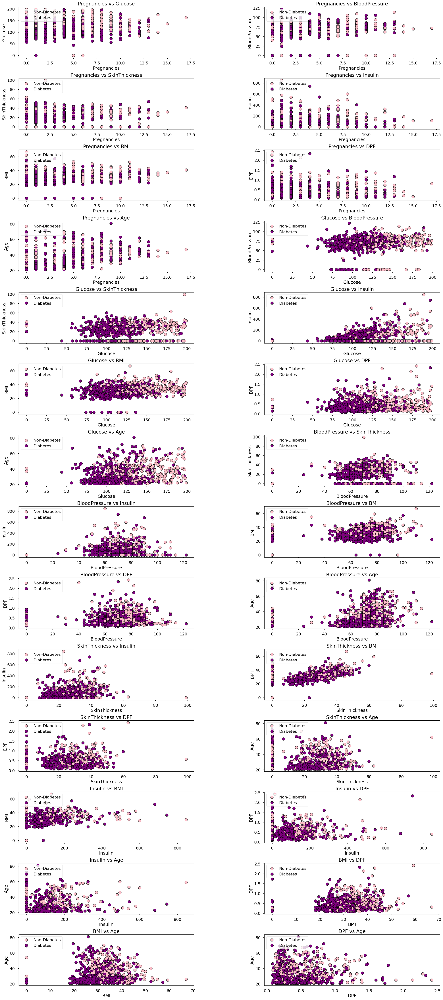

In [ ]:
a = 0
plt.style.use('seaborn-poster')
fig, ax = plt.subplots(nrows=14, ncols=2, figsize=(30, 70))
for i in range(len(feature_names)):
    for j in range(len(feature_names)):
        if i != j and j > i:
            a += 1
            plt.subplot(14,2,a)
            sns.scatterplot(x = feature_names[i],y = feature_names[j],data = data,hue = 'Outcome',palette = colors,edgecolor = 'black');
            plt.legend(['Non-Diabetes','Diabetes'],loc = 'upper left',)
            title = feature_names[i] + ' vs ' + feature_names[j]
            plt.title(title)

plt.subplots_adjust(hspace=0.4, wspace=0.4)


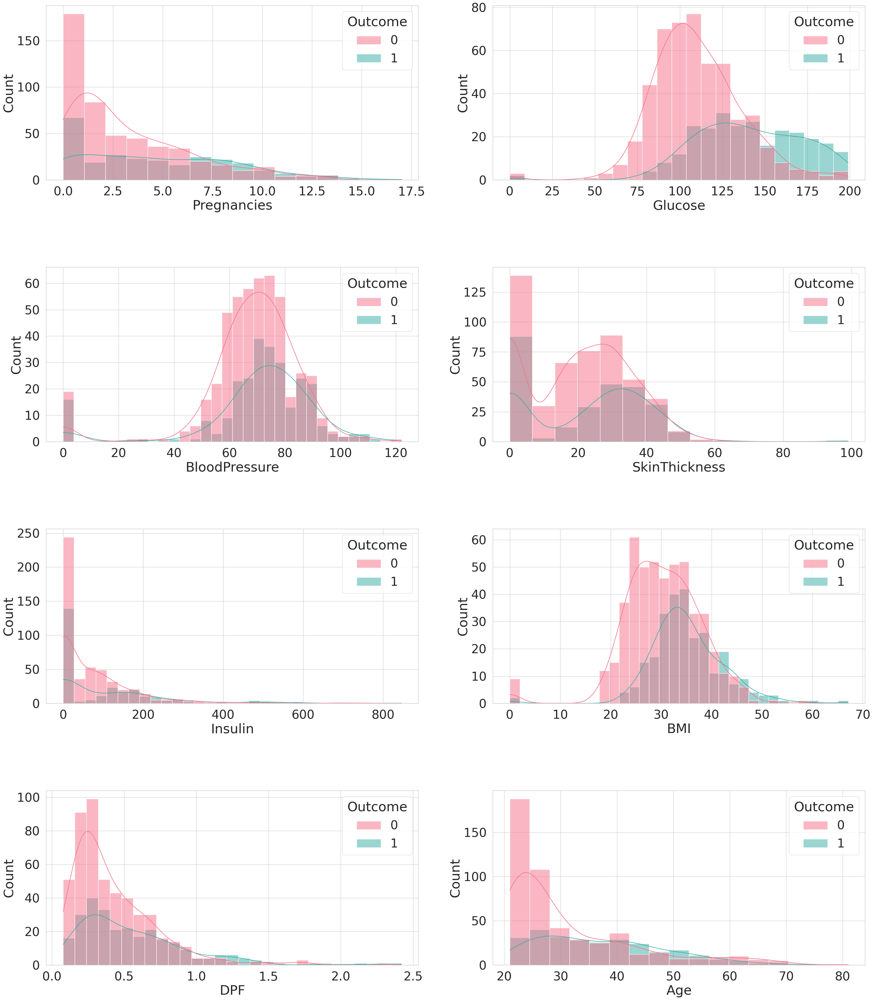

In [ ]:
rcParams['figure.figsize'] = 40, 60
sns.set(font_scale=3)
sns.set_style("whitegrid")
sns.set_palette("husl")
plt.subplots_adjust(hspace=0.5)
i = 1
for feature in feature_names:
    plt.subplot(5, 2, i)
    sns.histplot(data=data, x=feature, hue="Outcome",kde=True,palette="husl")
    i = i + 1


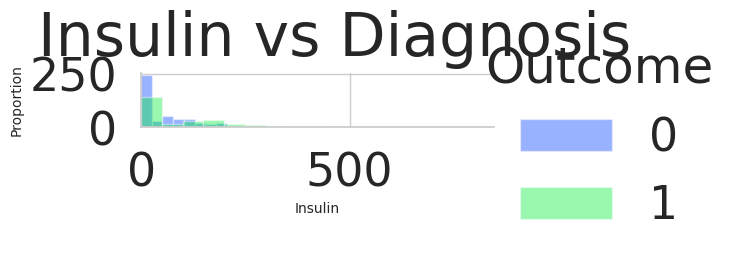

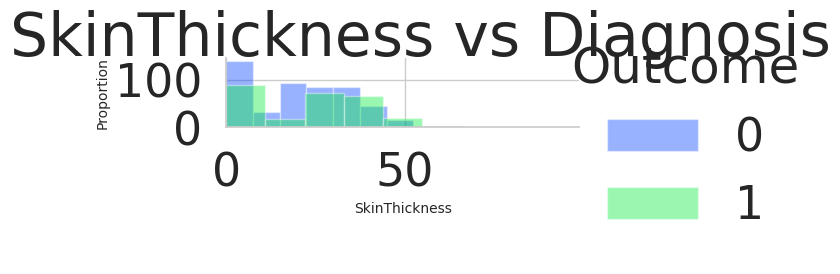

In [ ]:
plt.style.use('seaborn-bright')

def plotHistogram(values, label, feature, title):
    sns.set_style("whitegrid")
    plotOne = sns.FacetGrid(values, hue=label, aspect=2)
    plotOne.map(sns.distplot, feature, kde=False)
    plotOne.set(xlim=(0, values[feature].max()))
    plotOne.add_legend()
    plotOne.set_axis_labels(feature, 'Proportion', fontsize=10)
    plotOne.fig.suptitle(title)
    plt.show()

plotHistogram(data, "Outcome", 'Insulin', 'Insulin vs Diagnosis')
plotHistogram(data, "Outcome", 'SkinThickness', 'SkinThickness vs Diagnosis')


In [ ]:
data2 = data.copy()
print("\nColumn Name\t# of Null Values\n")
print((data2[:] == 0).sum())


Column Name	# of Null Values

Pregnancies      111
Glucose            5
BloodPressure     35
SkinThickness    227
Insulin          374
BMI               11
DPF                0
Age                0
Outcome          500
dtype: int64


In [ ]:
print("\nColumn Name\t% Null Values\n")
print((data2[:] == 0).sum()/ data2.shape[0] * 100)


Column Name	% Null Values

Pregnancies      14.453125
Glucose           0.651042
BloodPressure     4.557292
SkinThickness    29.557292
Insulin          48.697917
BMI               1.432292
DPF               0.000000
Age               0.000000
Outcome          65.104167
dtype: float64


Text(0.5, 1.0, 'Correlation Plot')

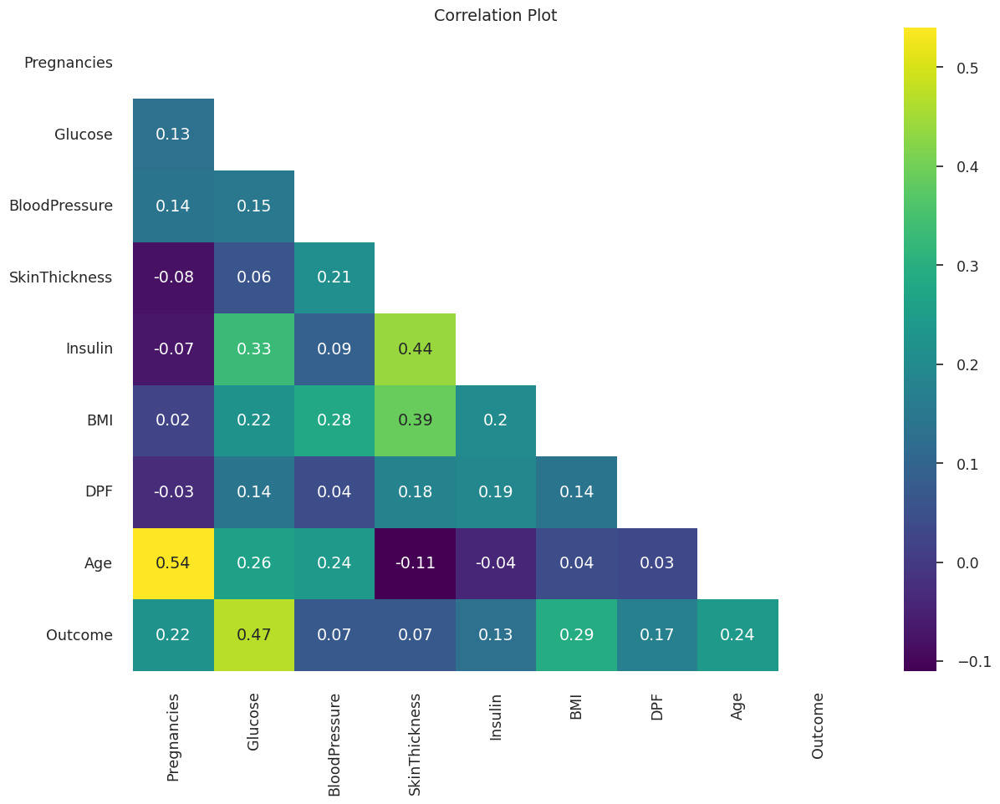

In [ ]:
corr=data.corr().round(2)

sns.set(font_scale=1.15)
plt.figure(figsize=(14, 10))
sns.set_palette("bright")
sns.set_style("white")
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr,annot=True,cmap='viridis',mask=mask,cbar=True)
plt.title('Correlation Plot')

In [ ]:
data.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DPF,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DPF,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


In [ ]:
zero_features = ['Glucose','BloodPressure','SkinThickness',"Insulin",'BMI']

In [ ]:
skin_thickness = data['SkinThickness']
insulin = data['Insulin']
glucose = data['Glucose']
blood_pressure = data['BloodPressure']
bmi = data['BMI']

In [ ]:


def grubbs_test(x):
    n = len(x)
    mean_x = np.mean(x)
    sd_x = np.std(x)
    numerator = max(abs(x - mean_x))  
    g_calculated = numerator / sd_x  
    print("Grubbs Calculated Value:", g_calculated)
    
    t_value = stats.t.ppf(1 - 0.05 / (2 * n), n - 2)
    g_critical = ((n - 1) * np.sqrt(np.square(t_value))) / (np.sqrt(n) * np.sqrt(n - 2 + np.square(t_value)))
    print("Grubbs Critical Value:", g_critical)
    
    if g_calculated > g_critical:
        print("Reject null hypothesis: There is an outlier in the data.\n")
    else:
        print("Accept null hypothesis: There are no outliers in the data.\n")


for feature in zero_features:
    print("Grubb's Test for", feature, ":")
    grubbs_test(data[feature])


Grubb's Test for Glucose :
Grubbs Calculated Value: 3.78365371377963
Grubbs Critical Value: 3.9740915882336183
Accept null hypothesis: There are no outliers in the data.

Grubb's Test for BloodPressure :
Grubbs Calculated Value: 3.572597239872642
Grubbs Critical Value: 3.9740915882336183
Accept null hypothesis: There are no outliers in the data.

Grubb's Test for SkinThickness :
Grubbs Calculated Value: 4.921865835155955
Grubbs Critical Value: 3.9740915882336183
Reject null hypothesis: There is an outlier in the data.

Grubb's Test for Insulin :
Grubbs Calculated Value: 6.65283937836845
Grubbs Critical Value: 3.9740915882336183
Reject null hypothesis: There is an outlier in the data.

Grubb's Test for BMI :
Grubbs Calculated Value: 4.455807490825074
Grubbs Critical Value: 3.9740915882336183
Reject null hypothesis: There is an outlier in the data.



In [ ]:
outlier_features = ['SkinThickness','Insulin','BMI']

In [ ]:
disbates_mean = data[outlier_features].mean()

data[outlier_features] = data[outlier_features].replace(0, disbates_mean)

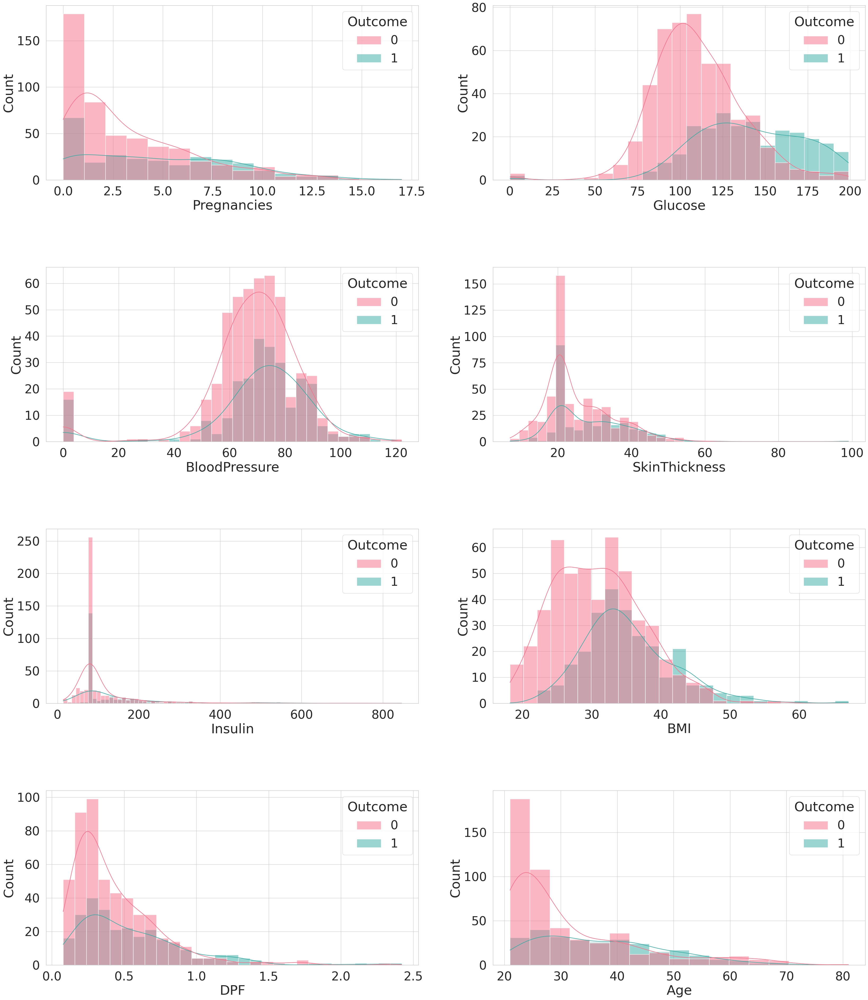

In [ ]:
feature_names = [cname for cname in data.loc[:,:'Age'].columns]
rcParams['figure.figsize'] = 40, 60
sns.set(font_scale=3)
sns.set_style("whitegrid")
sns.set_palette("husl")
plt.subplots_adjust(hspace=0.5)
i = 1
for feature in feature_names:
    plt.subplot(5, 2, i)
    sns.histplot(data=data, x=feature, hue="Outcome",kde=True,palette="husl")
    i = i + 1

In [ ]:
fig = make_subplots(rows=2, cols=4, subplot_titles=columns)
for i, col in enumerate(columns, start=1):
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3 - q1
    upper = q3 + (1.5 * iqr)
    lower = q1 - (1.5 * iqr)
    data[col][data[col] > upper] = upper
    data[col][data[col] < lower] = lower
    trace = go.Box(y=data[col], name=col)
    row = (i - 1) // 4 + 1
    col = (i - 1) % 4 + 1
    fig.add_trace(trace, row=row, col=col)
fig.update_layout(title_text='Box Plot of Columns without Outliers',
                  title_x=0.5, title_y=0.95, height=800, width=1000, template='ggplot2')
fig.show()

Text(0.5, 1.0, 'Correlation Plot')

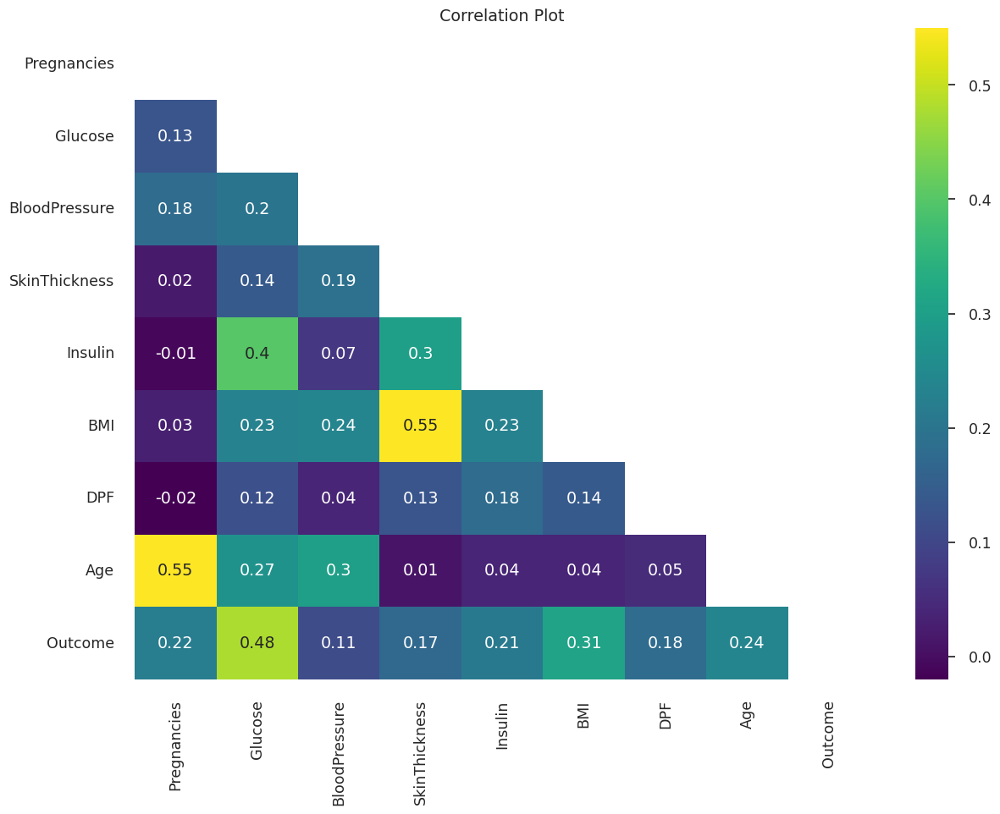

In [ ]:
corr=data.corr().round(2)

sns.set(font_scale=1.15)
plt.figure(figsize=(14, 10))
sns.set_palette("bright")
sns.set_style("white")
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr,annot=True,cmap='viridis',mask=mask,cbar=True)
plt.title('Correlation Plot')

In [ ]:
target_corr = corr[['Outcome']].drop('Outcome')
target_corr

,Outcome
Pregnancies,0.22
Glucose,0.48
BloodPressure,0.11
SkinThickness,0.17
Insulin,0.21
BMI,0.31
DPF,0.18
Age,0.24


<Figure size 1000x800 with 0 Axes>

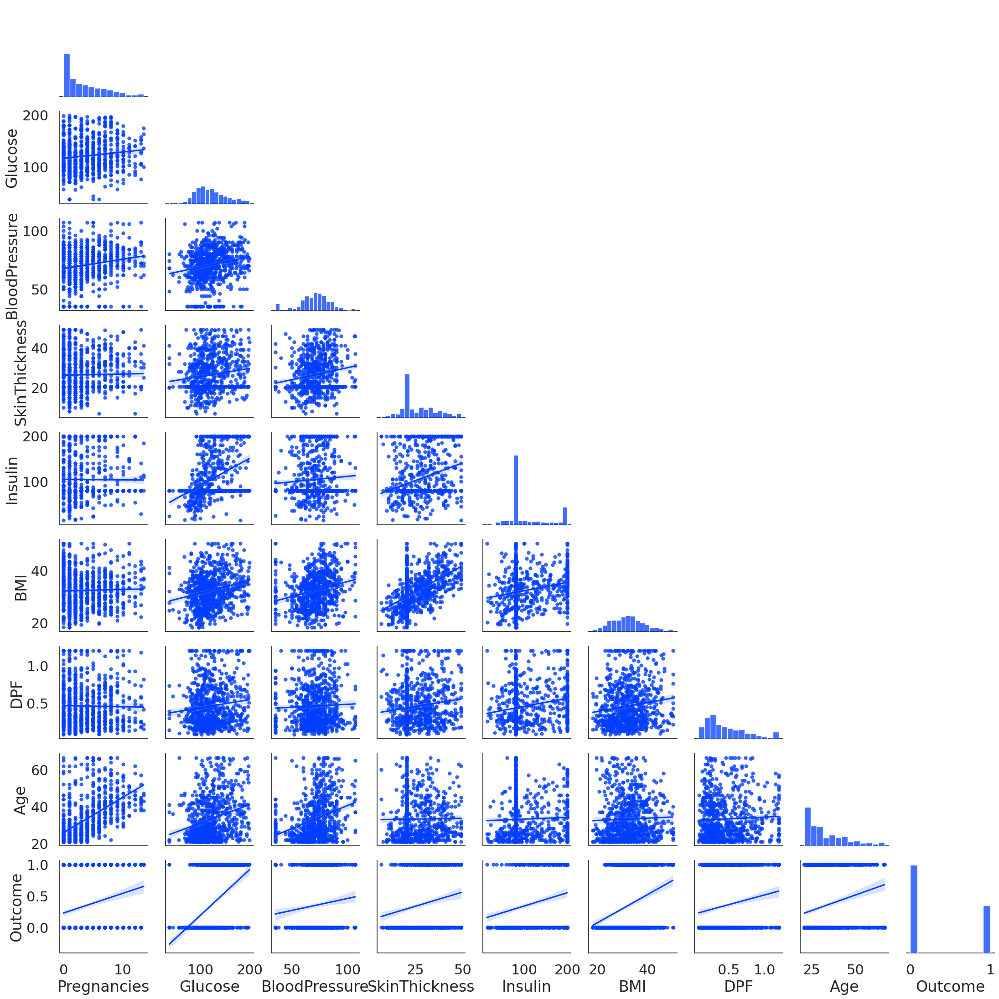

In [ ]:
sns.set(font_scale=2)
plt.figure(figsize=(10, 8))
sns.set_style("white")
sns.set_palette("bright")
sns.pairplot(data,kind = 'reg',corner = True,palette ='YlGnBu' )

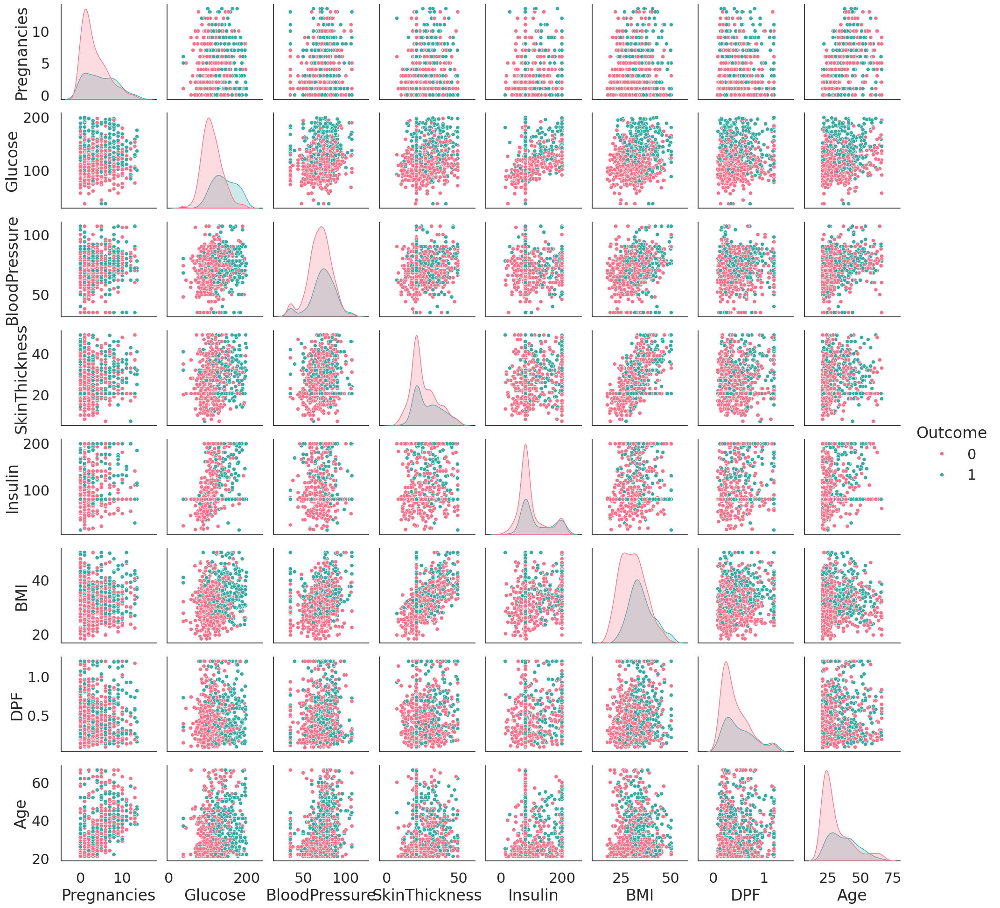

In [ ]:
sns.pairplot(data, hue='Outcome', palette='husl', diag_kind='kde')
plt.show()

correlation test

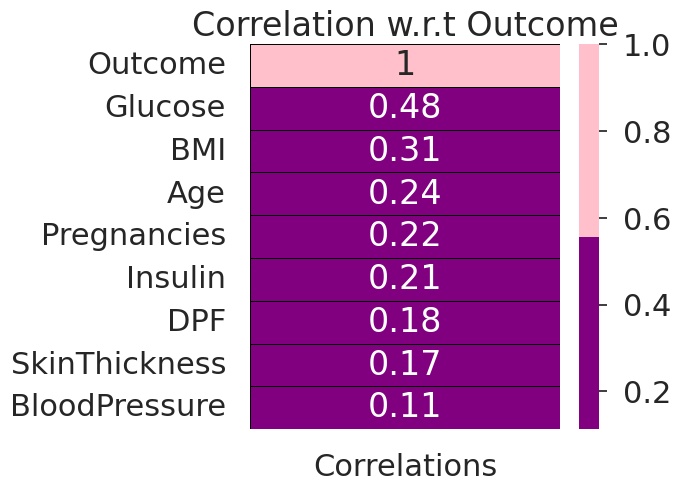

In [ ]:
corr = data.corrwith(data['Outcome']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (5,5))
sns.heatmap(corr,annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black');
plt.title('Correlation w.r.t Outcome');

ANOVA test

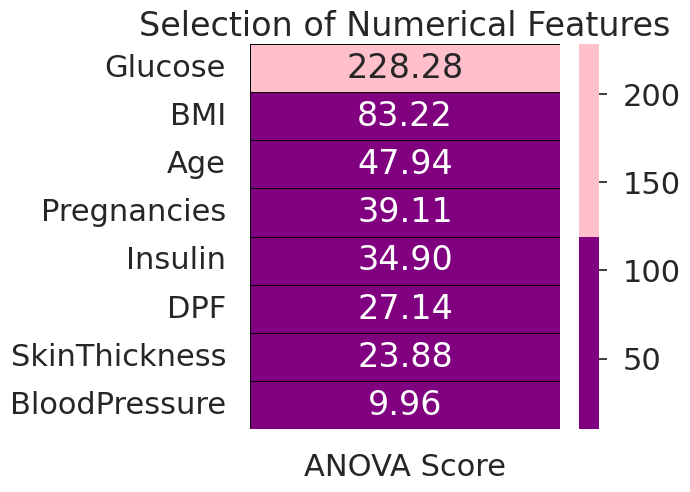

In [ ]:
features = data.loc[:,feature_names]
target = data['Outcome']

best_features = SelectKBest(score_func = f_classif,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['ANOVA Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'ANOVA Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Numerical Features');

In [ ]:
fig = px.histogram(data, x="Glucose", 
                   color="Outcome", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_font_color="black",
    legend_title_font_color="green",
    title={
        'text': "Glucose Histogram per Outcome",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
)
fig.show()

In [ ]:
import plotly.express as px
fig = px.histogram(data, x="BMI", 
                   color="Outcome", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_font_color="black",
    legend_title_font_color="green",
    title={
        'text': "BMI Histogram per Outcome",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
)
fig.show()

In [ ]:
import plotly.express as px
fig = px.histogram(data, x="Age", 
                   color="Outcome", 
                   marginal="box",
                   barmode ="overlay",
                   histnorm ='density'
                  )  
fig.update_layout(
    title_font_color="black",
    legend_title_font_color="green",
    title={
        'text': "Age Histogram per Outcome",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
)
fig.show()

In [ ]:
X = data.drop('Outcome',axis=1)
y = data['Outcome']

<Axes: >

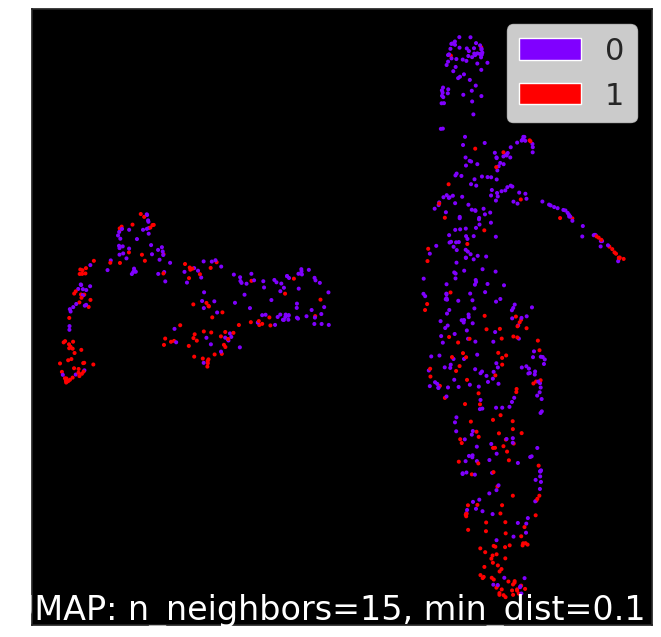

In [ ]:
mapper = umap.UMAP().fit(X) 
umap.plot.points(mapper, labels=y, theme='fire')

In [ ]:
umap_3d = UMAP(n_components=3, init='random', random_state=0)
x_umap = umap_3d.fit_transform(X)
umap_df = pd.DataFrame(x_umap)
train_y_sr = pd.Series(y,name='label').astype(str)
print(type(x_umap))
new_df = pd.concat([umap_df,train_y_sr],axis=1)
fig = px.scatter_3d(
    new_df, x=0, y=1, z=2,
    color='label', labels={'color': 'number'}
)
fig.update_traces(marker_size=1.5)
fig.show()

<class 'numpy.ndarray'>


## Modeling

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20,
                                            random_state=42, shuffle =True,stratify=y)

In [ ]:
smoten = SMOTEENN(random_state=42)
X_resampled, y_resampled = smoten.fit_resample(X, y)

In [ ]:
X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_resampled, y_resampled,
                                                                           test_size=0.20,random_state=42, shuffle =True,stratify=y_resampled)

In [ ]:
models = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(),
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'KNN': KNeighborsClassifier(),
    'SVC': SVC(probability=True,random_state=42, class_weight='balanced'),
    'LogisticRegression': LogisticRegression(random_state=42, class_weight='balanced', max_iter=10000, solver="saga"),
    'CatBoost': CatBoostClassifier(logging_level='Silent'),
    'GradientBoosting': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42, algorithm='SAMME'),
    'NaiveBayes': GaussianNB()
}

cv_results1 = {}
for model_name, model in models.items():
    print(f"Cross-validating {model_name}...")
    cv_scores = cross_val_score(model, X_train_resampled, y_train_resampled, cv=5, scoring='accuracy', n_jobs=-1,verbose=0)
    cv_results1[model_name] = cv_scores.mean()
    print(f"Mean accuracy for {model_name}: {cv_scores.mean():.4f}")
    print()


Cross-validating RandomForest...


Mean accuracy for RandomForest: 0.9461

Cross-validating XGBoost...
Mean accuracy for XGBoost: 0.9506

Cross-validating DecisionTree...
Mean accuracy for DecisionTree: 0.9011

Cross-validating KNN...
Mean accuracy for KNN: 0.9371

Cross-validating SVC...
Mean accuracy for SVC: 0.8517

Cross-validating LogisticRegression...
Mean accuracy for LogisticRegression: 0.7708

Cross-validating CatBoost...
Mean accuracy for CatBoost: 0.9596

Cross-validating GradientBoosting...
Mean accuracy for GradientBoosting: 0.9483

Cross-validating AdaBoost...
Mean accuracy for AdaBoost: 0.9348

Cross-validating NaiveBayes...
Mean accuracy for NaiveBayes: 0.8382



In [ ]:
models = {
    'RandomForest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(),
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'KNN': KNeighborsClassifier(),
    'SVC': SVC(probability=True,random_state=42, class_weight='balanced'),
    'LogisticRegression': LogisticRegression(random_state=42, class_weight='balanced', max_iter=10000, solver="saga"),
    'CatBoost': CatBoostClassifier(logging_level='Silent'),
    'GradientBoosting': GradientBoostingClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42, algorithm='SAMME'),
    'NaiveBayes': GaussianNB()
}

cv_results = {}
for model_name, model in models.items():
    print(f"Cross-validating {model_name}...")
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1,verbose=0)
    cv_results[model_name] = cv_scores.mean()
    print(f"Mean accuracy for {model_name}: {cv_scores.mean():.4f}")
    print()

Cross-validating RandomForest...


Mean accuracy for RandomForest: 0.7639

Cross-validating XGBoost...
Mean accuracy for XGBoost: 0.7199

Cross-validating DecisionTree...
Mean accuracy for DecisionTree: 0.6873

Cross-validating KNN...
Mean accuracy for KNN: 0.7477

Cross-validating SVC...
Mean accuracy for SVC: 0.7525

Cross-validating LogisticRegression...
Mean accuracy for LogisticRegression: 0.7102

Cross-validating CatBoost...
Mean accuracy for CatBoost: 0.7606

Cross-validating GradientBoosting...
Mean accuracy for GradientBoosting: 0.7525

Cross-validating AdaBoost...
Mean accuracy for AdaBoost: 0.7574

Cross-validating NaiveBayes...
Mean accuracy for NaiveBayes: 0.7606



In [ ]:
cv_results_df = pd.DataFrame(list(cv_results.items()), columns=['Model', 'Mean Accuracy'])
cv_results_df = cv_results_df.sort_values(by='Mean Accuracy', ascending=False)
cv_results_df

,Model,Mean Accuracy
0,RandomForest,0.763894
6,CatBoost,0.760616
9,NaiveBayes,0.760616
8,AdaBoost,0.757377
7,GradientBoosting,0.752499
4,SVC,0.752486
3,KNN,0.747661
1,XGBoost,0.719925
5,LogisticRegression,0.710196
2,DecisionTree,0.687298


In [ ]:
best_model_name = cv_results_df.iloc[0]['Model']
print(f"\nBest model from CV: {best_model_name}")


Best model from CV: RandomForest


In [ ]:
fig = px.bar(cv_results_df, x='Model', y='Mean Accuracy', title='Cross-Validation Accuracy for Different Models',text_auto=True,
             labels={'Mean Accuracy': 'Mean Accuracy'}, color='Mean Accuracy')
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20, color='mediumorchid'),
    template="ggplot2",  
    width=800,              
    height=600 
)
fig.show()

In [ ]:
over = SMOTE(sampling_strategy=0.8)
under = RandomUnderSampler(sampling_strategy=0.8)

In [ ]:
num_features = [cname for cname in data.loc[:, :'Age'].columns]
print(num_features)

['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DPF', 'Age']


In [ ]:

preprocessor = ColumnTransformer(
    transformers = [
        ('num', StandardScaler(), num_features)
    ]
)

In [ ]:
clf1 = imbPipeline(steps=[('preprocessor', preprocessor),
                      ('over', over),
                      ('under', under),
                      ('classifier', RandomForestClassifier())])

In [ ]:
param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4]
}


In [ ]:
X1 = data.drop('Outcome', axis=1)
y1 = data['Outcome']

In [ ]:
grid_search = GridSearchCV(clf1, param_grid, cv=5)

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)


In [ ]:
grid_search.fit(X_train1, y_train1)

print("Best Parameters: ", grid_search.best_params_)

Best Parameters:  {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 100}


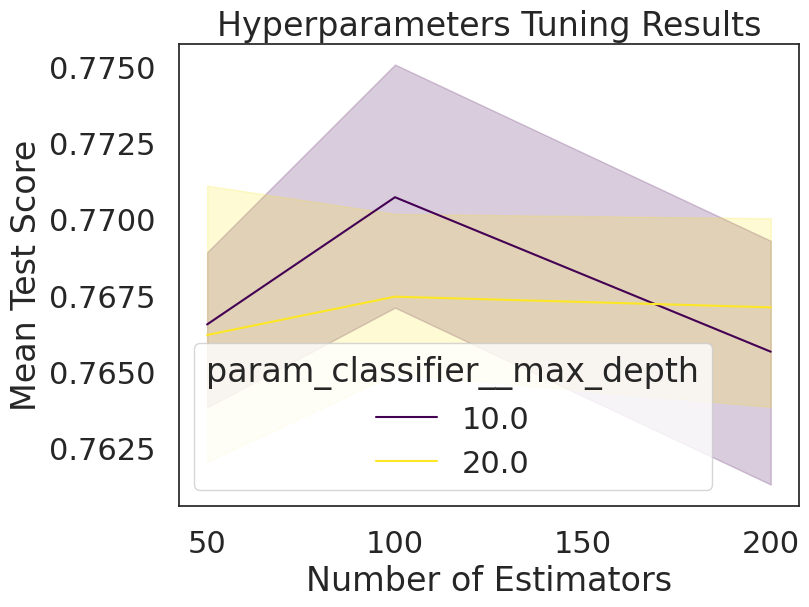

In [ ]:
results_df = pd.DataFrame(grid_search.cv_results_)
plt.figure(figsize=(8, 6))
sns.lineplot(data=results_df, x='param_classifier__n_estimators', y='mean_test_score', hue='param_classifier__max_depth', palette='viridis')
plt.title('Hyperparameters Tuning Results')
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Test Score')
plt.show()

Model Accuracy:  0.7857142857142857
              precision    recall  f1-score   support

           0       0.87      0.79      0.83        99
           1       0.67      0.78      0.72        55

    accuracy                           0.79       154
   macro avg       0.77      0.78      0.77       154
weighted avg       0.80      0.79      0.79       154



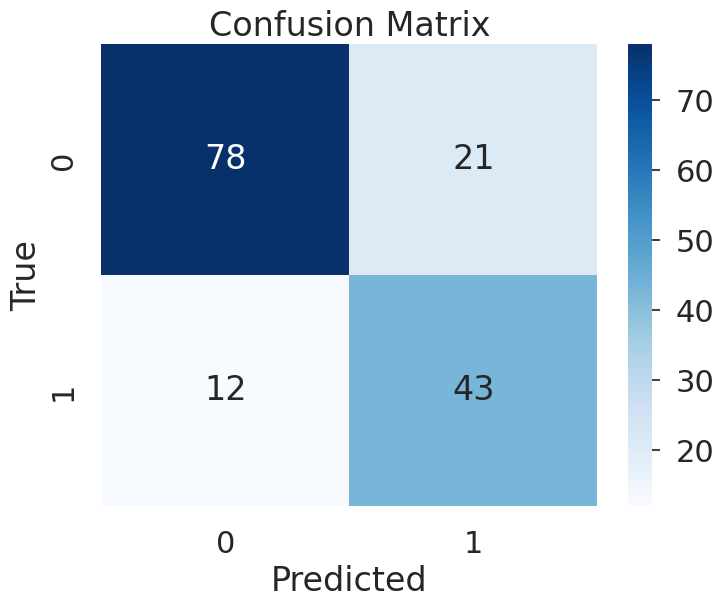

In [ ]:
y_pred = grid_search.predict(X_test1)

print("Model Accuracy: ", accuracy_score(y_test1, y_pred))
print(classification_report(y_test1, y_pred))

cm = confusion_matrix(y_test1, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

         Feature  Importance
1        Glucose    0.269323
7            Age    0.183018
5            BMI    0.171905
6            DPF    0.101000
0    Pregnancies    0.073037
4        Insulin    0.069278
3  SkinThickness    0.068712
2  BloodPressure    0.063728


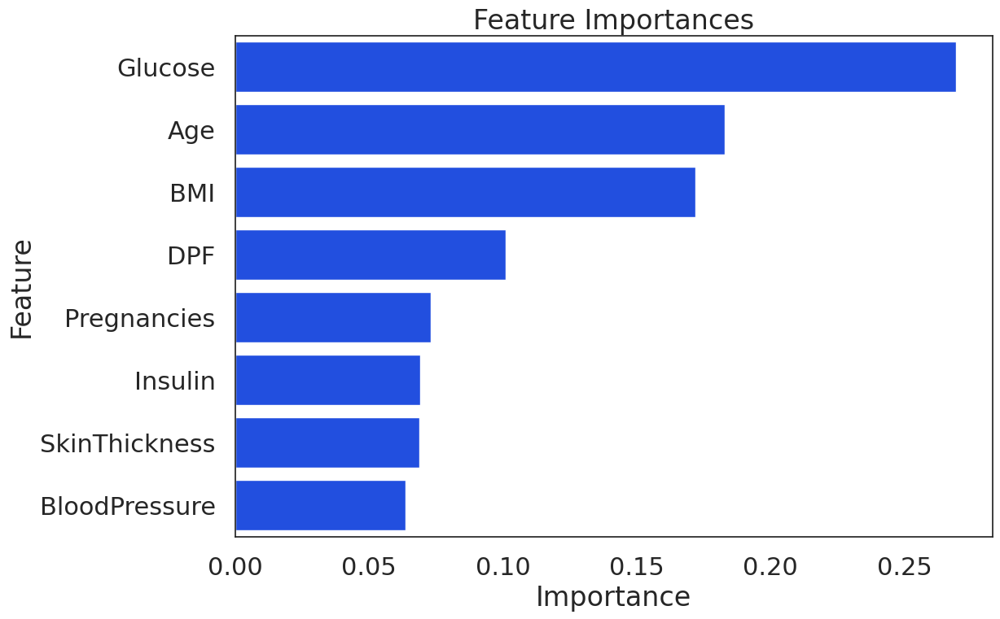

In [ ]:
feature_names = [cname for cname in data.loc[:, :'Age'].columns]

importances = grid_search.best_estimator_.named_steps['classifier'].feature_importances_

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

importance_df = importance_df.sort_values('Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importances')
plt.show()

### KNN

In [ ]:
def floatingDecimals(f_val, dec=3):
        prc = "{:."+str(dec)+"f}" #first cast decimal as str
    #     print(prc) #str format output is {:.3f}
        return float(prc.format(f_val))

In [ ]:
class GridSearch(object):
    
    def __init__(self,X_train,y_train,model,hyperparameters):
        
        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters
        
    def GridSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = GridSearchCV(self.model,
                                 self.hyperparameters,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_
    
    def BestModelPridict(self,X_test):
        
        best_model,_ = self.GridSearch()
        pred = best_model.predict(X_test)
        return pred
    

In [ ]:
model_KNN = KNeighborsClassifier()

neighbors = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
param_grid = dict(n_neighbors=neighbors)

Best: 0.763908 using {'n_neighbors': 18}
Model Accuracy:  0.7337662337662337
              precision    recall  f1-score   support

           0       0.75      0.89      0.81       100
           1       0.69      0.44      0.54        54

    accuracy                           0.73       154
   macro avg       0.72      0.67      0.68       154
weighted avg       0.73      0.73      0.72       154



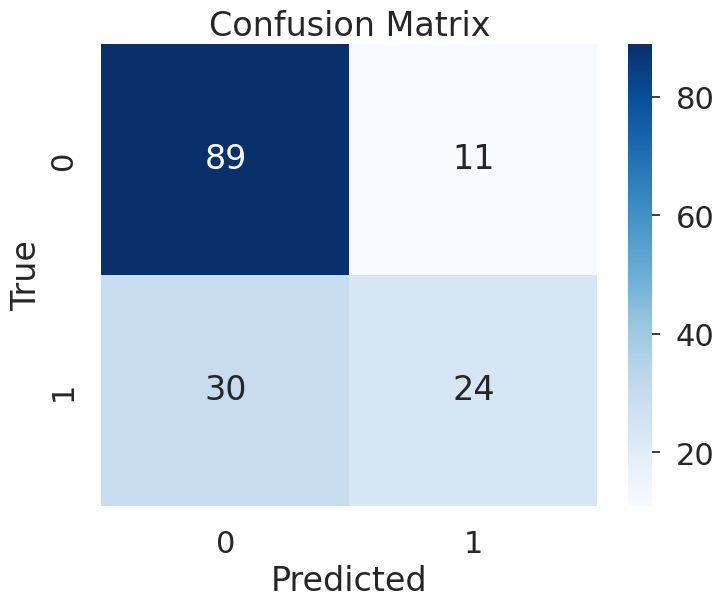

In [ ]:
KNN_GridSearch = GridSearch(X_train,y_train,model_KNN,param_grid)
Prediction_KNN = KNN_GridSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_KNN))
print(classification_report(y_test, Prediction_KNN))

cm = confusion_matrix(y_test, Prediction_KNN)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel("True")
plt.show()

### SVC

In [ ]:
c_values = [0.1, 0.3, 0.5, 0.7, 0.9, 1.0, 1.3, 1.5, 1.7, 2.0]
kernel_values = [ 'linear' , 'poly' , 'rbf' , 'sigmoid' ]
param_grid = dict(C=c_values, kernel=kernel_values)
model_SVC = SVC()

Best: 0.781835 using {'C': 0.1, 'kernel': 'linear'}
Model Accuracy:  0.7077922077922078
              precision    recall  f1-score   support

           0       0.75      0.82      0.78       100
           1       0.60      0.50      0.55        54

    accuracy                           0.71       154
   macro avg       0.68      0.66      0.67       154
weighted avg       0.70      0.71      0.70       154



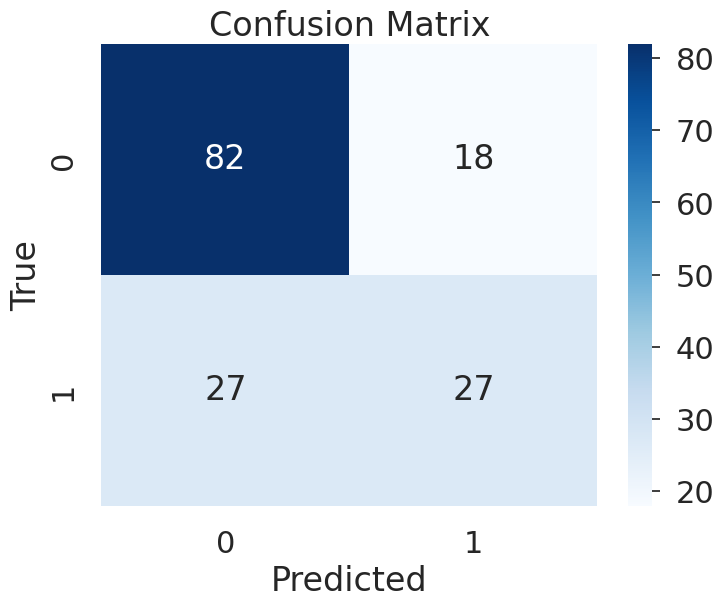

In [ ]:
SVC_GridSearch = GridSearch(X_train,y_train,model_SVC,param_grid)
Prediction_SVC = SVC_GridSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_SVC))
print(classification_report(y_test, Prediction_SVC))

cm = confusion_matrix(y_test, Prediction_SVC)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


### Decision Tree

In [ ]:
from scipy.stats import randint
max_depth_value = [3, None]
max_features_value =  randint(1, 4)
min_samples_leaf_value = randint(1, 4)
criterion_value = ["gini", "entropy"]

In [ ]:
class RandomSearch(object):
    
    def __init__(self,X_train,y_train,model,hyperparameters):
        
        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters
        
    def RandomSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = RandomizedSearchCV(self.model,
                                 self.hyperparameters,
                                 random_state=1,
                                 n_iter=100,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_
    
    def BestModelPridict(self,X_test):
        
        best_model,_ = self.RandomSearch()
        pred = best_model.predict(X_test)
        return pred
    

In [ ]:
param_grid = dict(max_depth = max_depth_value,
                  max_features = max_features_value,
                  min_samples_leaf = min_samples_leaf_value,
                  criterion = criterion_value)


Best: 0.750635 using {'criterion': 'gini', 'max_depth': 3, 'max_features': 3, 'min_samples_leaf': 1}
Model Accuracy:  0.7142857142857143
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       100
           1       0.60      0.56      0.58        54

    accuracy                           0.71       154
   macro avg       0.68      0.68      0.68       154
weighted avg       0.71      0.71      0.71       154



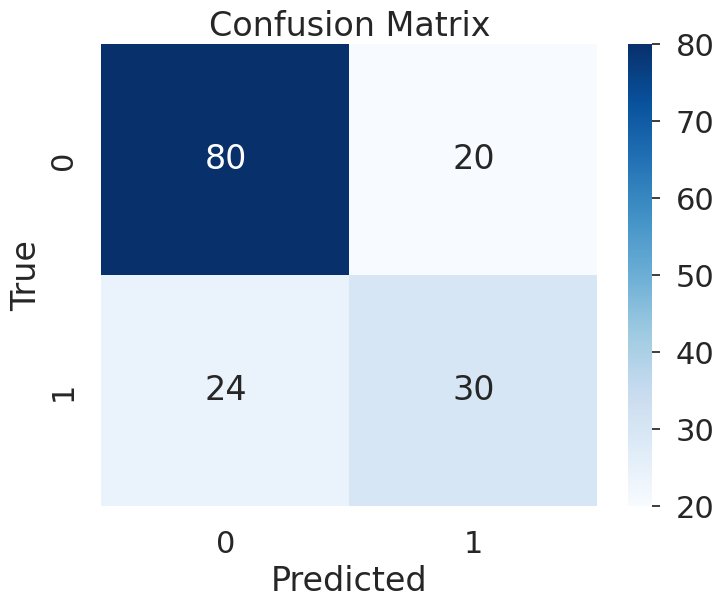

In [ ]:
model_CART = DecisionTreeClassifier()
CART_RandSearch = RandomSearch(X_train,y_train,model_CART,param_grid)
Prediction_CART = CART_RandSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_CART))
print(classification_report(y_test, Prediction_CART))

cm = confusion_matrix(y_test, Prediction_CART)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### AdaBoostClassifier

In [ ]:
learning_rate_value = [.01,.05,.1,.5,1]
n_estimators_value = [50,100,150,200,250,300]

param_grid = dict(learning_rate=learning_rate_value, n_estimators=n_estimators_value)

Best: 0.768720 using {'learning_rate': 0.5, 'n_estimators': 100}
Model Accuracy:  0.7532467532467533
              precision    recall  f1-score   support

           0       0.78      0.87      0.82       100
           1       0.69      0.54      0.60        54

    accuracy                           0.75       154
   macro avg       0.73      0.70      0.71       154
weighted avg       0.75      0.75      0.74       154



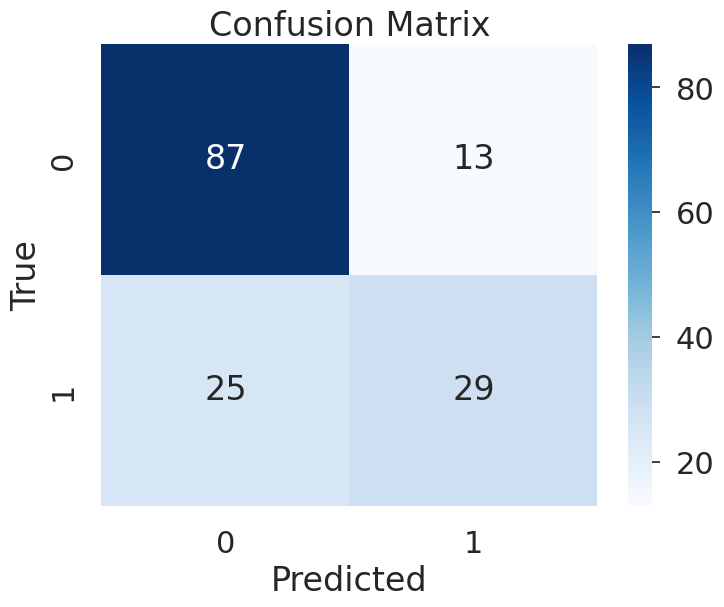

In [ ]:
model_Ad = AdaBoostClassifier(algorithm='SAMME')
Ad_GridSearch = GridSearch(X_train,y_train,model_Ad,param_grid)
Prediction_Ad = Ad_GridSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_Ad))
print(classification_report(y_test, Prediction_Ad))

cm = confusion_matrix(y_test, Prediction_Ad)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### Logistic Regression

In [ ]:
model = LogisticRegression(class_weight='balanced', max_iter=20000, solver="saga")
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter distribution using uniform distribution
C = uniform(loc=0, scale=4)

# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty)

Best: 0.710206 using {'C': 0.5052595401795532, 'penalty': 'l1'}
Model Accuracy:  0.7662337662337663
              precision    recall  f1-score   support

           0       0.87      0.75      0.81       100
           1       0.63      0.80      0.70        54

    accuracy                           0.77       154
   macro avg       0.75      0.77      0.76       154
weighted avg       0.79      0.77      0.77       154



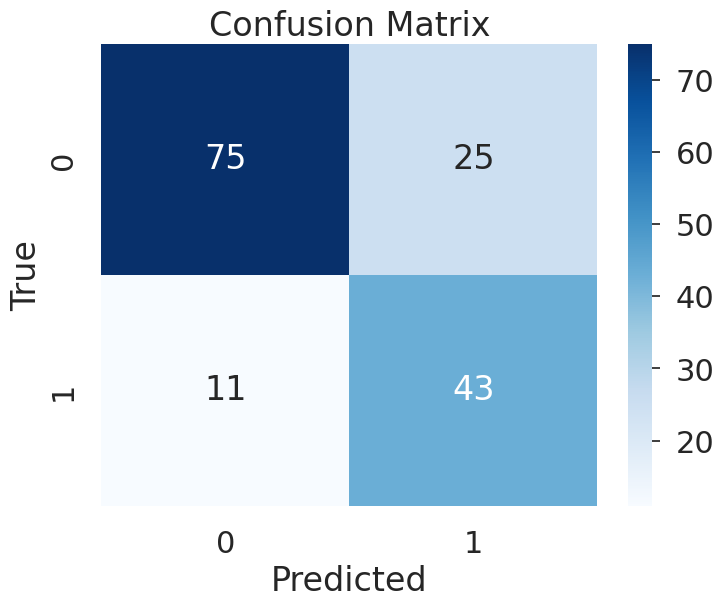

In [ ]:
LR_RandSearch = RandomSearch(X_train,y_train,model,hyperparameters)
# LR_best_model,LR_best_params = LR_RandSearch.RandomSearch()
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_LR))
print(classification_report(y_test, Prediction_LR))

cm = confusion_matrix(y_test, Prediction_LR)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### CatBoost Classifier

In [ ]:
learning_rate_value = [.01, .05, .1, .5, 1]
iterations_value = [50, 100, 150, 200, 250, 300]

param_grid = dict(learning_rate=learning_rate_value, iterations=iterations_value)

model_CatBoost = CatBoostClassifier(logging_level='Silent')

Best: 0.773665 using {'iterations': 100, 'learning_rate': 0.05}
Model Accuracy:  0.7272727272727273
              precision    recall  f1-score   support

           0       0.76      0.84      0.80       100
           1       0.64      0.52      0.57        54

    accuracy                           0.73       154
   macro avg       0.70      0.68      0.69       154
weighted avg       0.72      0.73      0.72       154



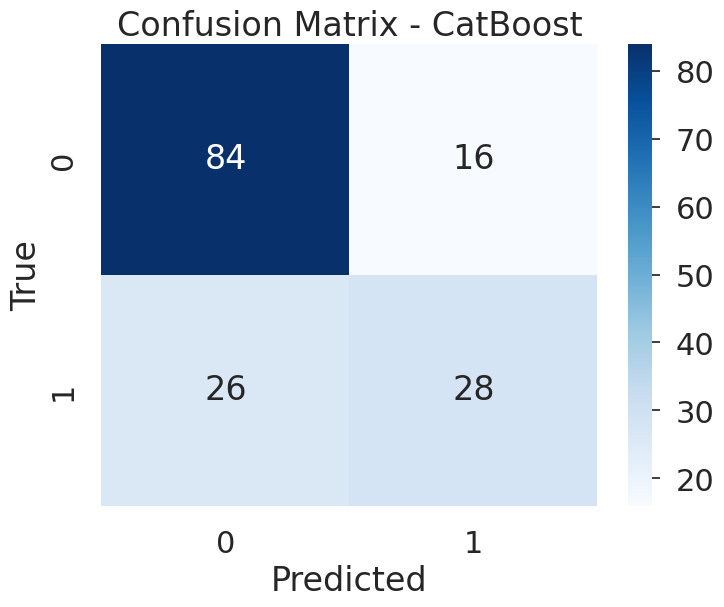

In [ ]:
CatBoost_GridSearch = GridSearch(X_train, y_train, model_CatBoost, param_grid)
Prediction_CatBoost = CatBoost_GridSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_CatBoost))
print(classification_report(y_test, Prediction_CatBoost))

cm = confusion_matrix(y_test, Prediction_CatBoost)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - CatBoost')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


### Naive Bayes

In [ ]:

var_smoothing_value = [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]

param_grid = dict(var_smoothing=var_smoothing_value)

model_NaiveBayes = GaussianNB()


Best: 0.757324 using {'var_smoothing': 1e-09}
Model Accuracy:  0.7272727272727273
              precision    recall  f1-score   support

           0       0.80      0.77      0.79       100
           1       0.60      0.65      0.62        54

    accuracy                           0.73       154
   macro avg       0.70      0.71      0.71       154
weighted avg       0.73      0.73      0.73       154



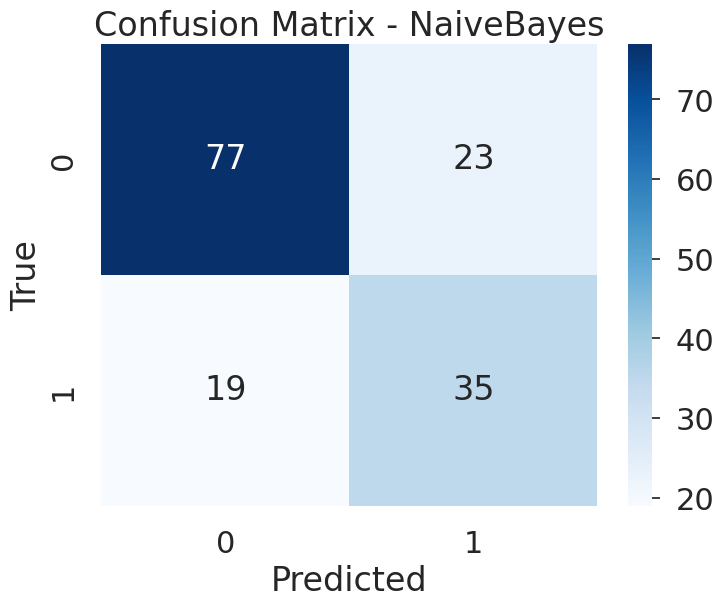

In [ ]:
NaiveBayes_GridSearch = GridSearch(X_train, y_train, model_NaiveBayes, param_grid)
Prediction_NaiveBayes = NaiveBayes_GridSearch.BestModelPridict(X_test)

print("Model Accuracy: ", accuracy_score(y_test, Prediction_NaiveBayes))
print(classification_report(y_test, Prediction_NaiveBayes))

cm = confusion_matrix(y_test, Prediction_NaiveBayes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - NaiveBayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
from pycaret.classification import *

In [ ]:
clf = setup(data = data, 
             target = 'Outcome',
             preprocess = False,
             verbose = False)

In [ ]:
top5 = compare_models(sort='AUC',
                      n_select = 5,
                      exclude=['mlp', 'tune', 'ens', 'lightgbm','xgboost','dummy','svm','ridge', 'lda']
                     )

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7600,0.8294,0.5459,0.7132,0.6137,0.4441,0.4558,0.1910
ada,Ada Boost Classifier,0.7729,0.8289,0.6357,0.6950,0.6586,0.4896,0.4955,0.0270
rf,Random Forest Classifier,0.7729,0.8252,0.5664,0.7296,0.6348,0.4738,0.4838,0.2840
catboost,CatBoost Classifier,0.7711,0.8238,0.5825,0.7157,0.6380,0.4737,0.4819,0.5430
nb,Naive Bayes,0.7581,0.8178,0.6523,0.6628,0.6539,0.4686,0.4715,0.1850
et,Extra Trees Classifier,0.7674,0.8177,0.5614,0.7176,0.6280,0.4622,0.4710,0.0790
qda,Quadratic Discriminant Analysis,0.7731,0.8137,0.6152,0.7140,0.6574,0.4888,0.4949,0.0100
gbc,Gradient Boosting Classifier,0.7691,0.8095,0.5933,0.7064,0.6396,0.4724,0.4804,0.0280
knn,K Neighbors Classifier,0.7282,0.7681,0.5497,0.6299,0.5804,0.3821,0.3888,0.2130
dt,Decision Tree Classifier,0.7150,0.6866,0.5933,0.5983,0.5891,0.3727,0.3769,0.3270


In [ ]:
stack_model = stack_models(estimator_list = top5, meta_model = top5[0],optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6481,0.6647,0.4737,0.5000,0.4865,0.2192,0.2194
1,0.7593,0.8692,0.6316,0.6667,0.6486,0.4658,0.4661
2,0.7407,0.8301,0.5263,0.6667,0.5882,0.4028,0.4088
3,0.7963,0.9023,0.6316,0.7500,0.6857,0.5367,0.5410
4,0.7222,0.7985,0.5789,0.6111,0.5946,0.3836,0.3839
5,0.7778,0.8466,0.5263,0.7692,0.6250,0.4749,0.4921
6,0.8333,0.8992,0.5789,0.9167,0.7097,0.6010,0.6322
7,0.7925,0.8286,0.5000,0.8182,0.6207,0.4890,0.5171
8,0.8491,0.8587,0.6111,0.9167,0.7333,0.6339,0.6592


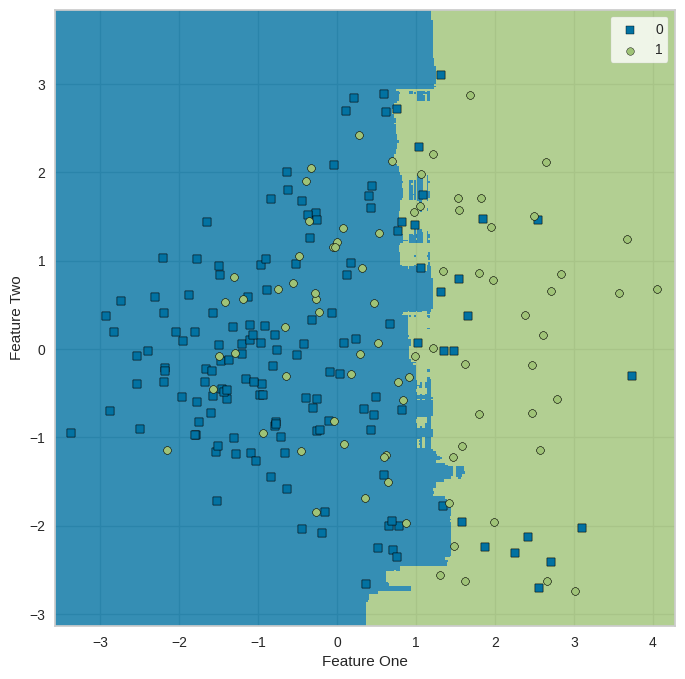

In [ ]:
plt.figure(figsize=(8, 8))
plot_model(stack_model, plot='boundary')

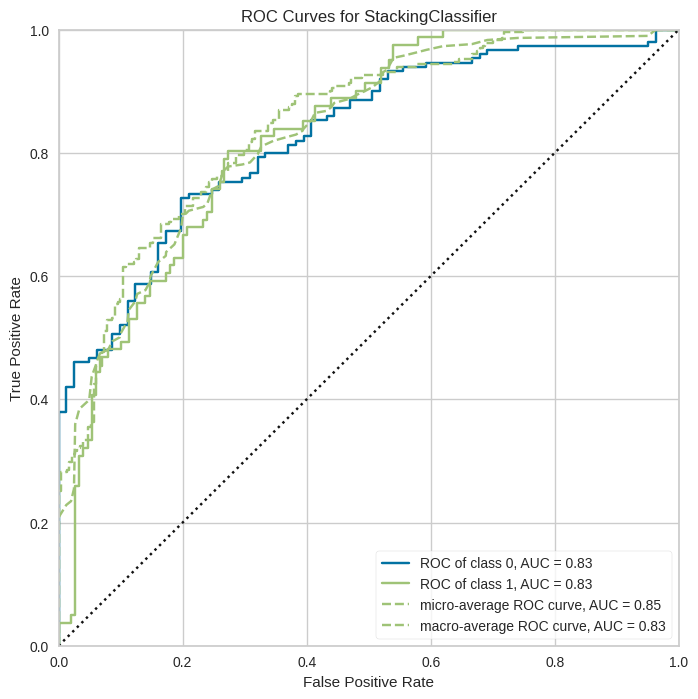

In [ ]:
plt.figure(figsize=(8, 8))
plot_model(stack_model, plot = 'auc')

In [ ]:
pred1 = stack_model.predict(X_test)

Model Accuracy:  0.8246753246753247
              precision    recall  f1-score   support

           0       0.85      0.88      0.87       100
           1       0.76      0.72      0.74        54

    accuracy                           0.82       154
   macro avg       0.81      0.80      0.80       154
weighted avg       0.82      0.82      0.82       154



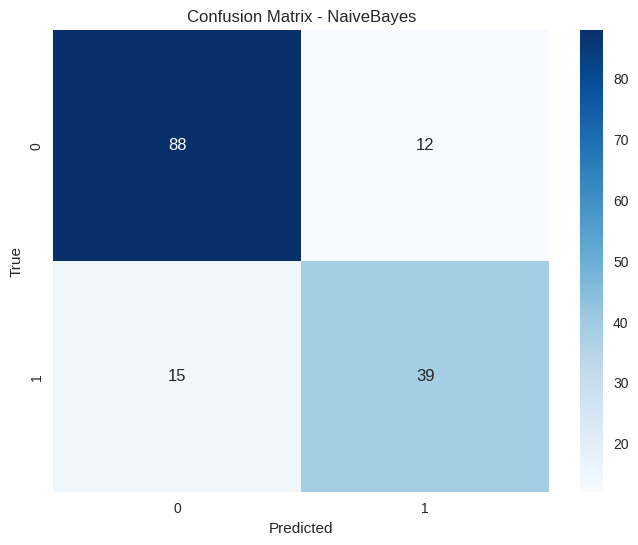

In [ ]:
print("Model Accuracy: ", accuracy_score(y_test, pred1))
print(classification_report(y_test, pred1))

cm = confusion_matrix(y_test, pred1)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - NaiveBayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
blend_soft = blend_models(estimator_list = top5, optimize = 'AUC',method = 'soft')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5926,0.6586,0.4737,0.4286,0.4500,0.1278,0.1282
1,0.7593,0.8842,0.6842,0.6500,0.6667,0.4785,0.4788
2,0.7222,0.8301,0.5263,0.6250,0.5714,0.3682,0.3711
3,0.7778,0.9038,0.6316,0.7059,0.6667,0.5008,0.5025
4,0.7037,0.7955,0.5789,0.5789,0.5789,0.3504,0.3504
5,0.7778,0.8556,0.5263,0.7692,0.6250,0.4749,0.4921
6,0.8148,0.8962,0.5789,0.8462,0.6875,0.5624,0.5828
7,0.7736,0.8302,0.5000,0.7500,0.6000,0.4508,0.4688
8,0.8302,0.8651,0.6111,0.8462,0.7097,0.5940,0.6098


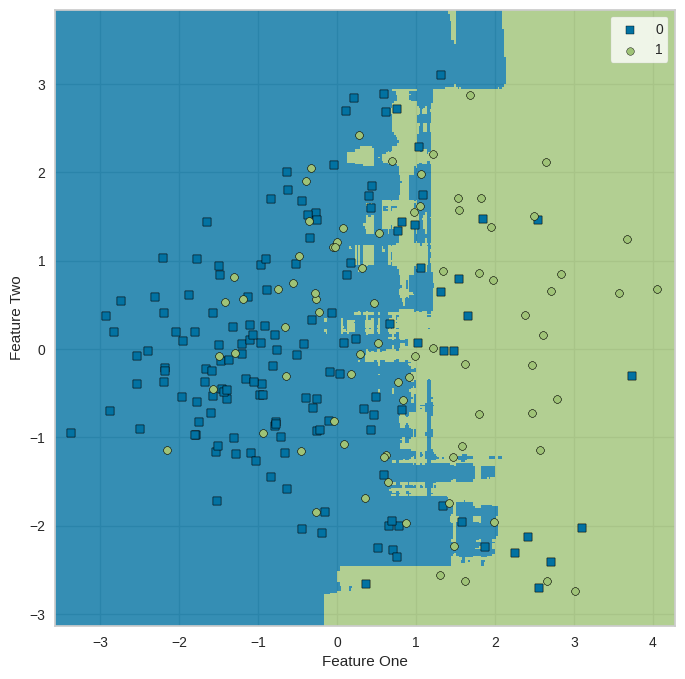

In [ ]:
plt.figure(figsize=(8, 8))
plot_model(blend_soft, plot='boundary')

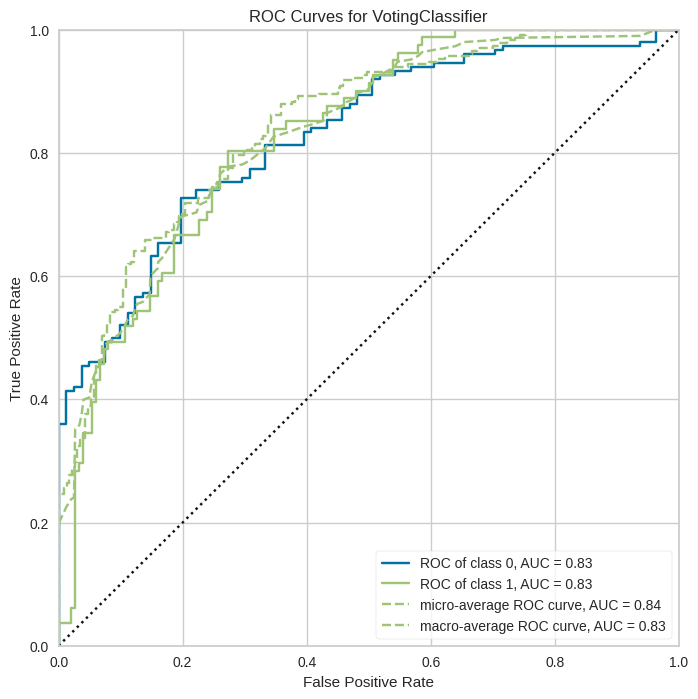

In [ ]:
plt.figure(figsize=(8, 8))
plot_model(blend_soft, plot = 'auc')

In [ ]:
pred2 = blend_soft.predict(X_test)

Model Accuracy:  0.8181818181818182
              precision    recall  f1-score   support

           0       0.86      0.86      0.86       100
           1       0.74      0.74      0.74        54

    accuracy                           0.82       154
   macro avg       0.80      0.80      0.80       154
weighted avg       0.82      0.82      0.82       154



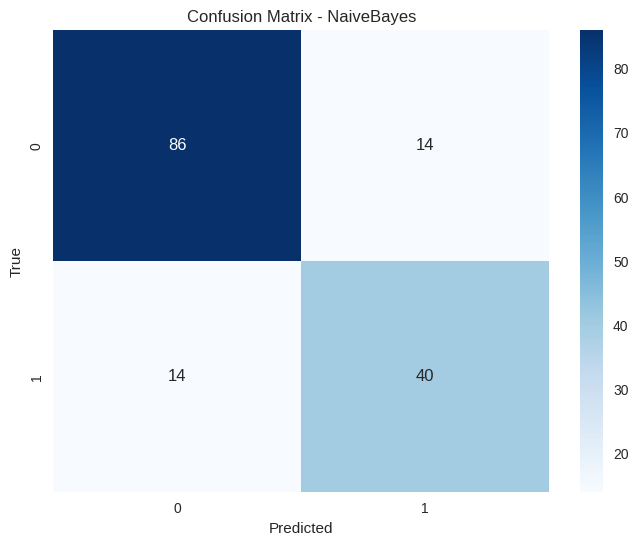

In [ ]:
print("Model Accuracy: ", accuracy_score(y_test, pred2))
print(classification_report(y_test, pred2))

cm = confusion_matrix(y_test, pred2)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - NaiveBayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
blend_hard = blend_models(estimator_list = top5, optimize = 'AUC',method = 'hard')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6481,0.0000,0.5263,0.5000,0.5128,0.2377,0.2379
1,0.7778,0.0000,0.6842,0.6842,0.6842,0.5128,0.5128
2,0.7222,0.0000,0.5263,0.6250,0.5714,0.3682,0.3711
3,0.8148,0.0000,0.7368,0.7368,0.7368,0.5940,0.5940
4,0.7407,0.0000,0.5789,0.6471,0.6111,0.4176,0.4190
5,0.7778,0.0000,0.5263,0.7692,0.6250,0.4749,0.4921
6,0.8148,0.0000,0.5789,0.8462,0.6875,0.5624,0.5828
7,0.7925,0.0000,0.5556,0.7692,0.6452,0.5038,0.5172
8,0.8302,0.0000,0.5556,0.9091,0.6897,0.5819,0.6154


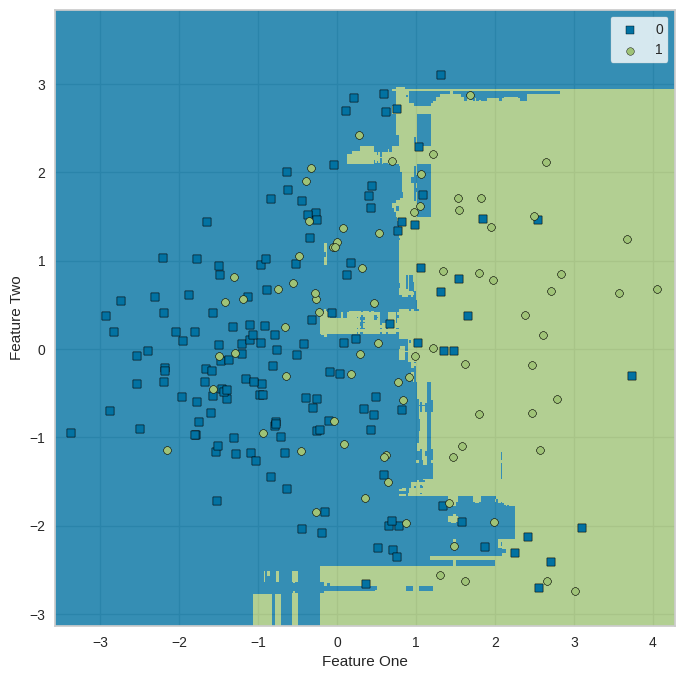

In [ ]:
plt.figure(figsize=(8, 8))
plot_model(blend_hard, plot='boundary')

In [ ]:
pred3 = blend_hard.predict(X_test)

Model Accuracy:  0.8311688311688312
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       100
           1       0.76      0.76      0.76        54

    accuracy                           0.83       154
   macro avg       0.81      0.81      0.81       154
weighted avg       0.83      0.83      0.83       154



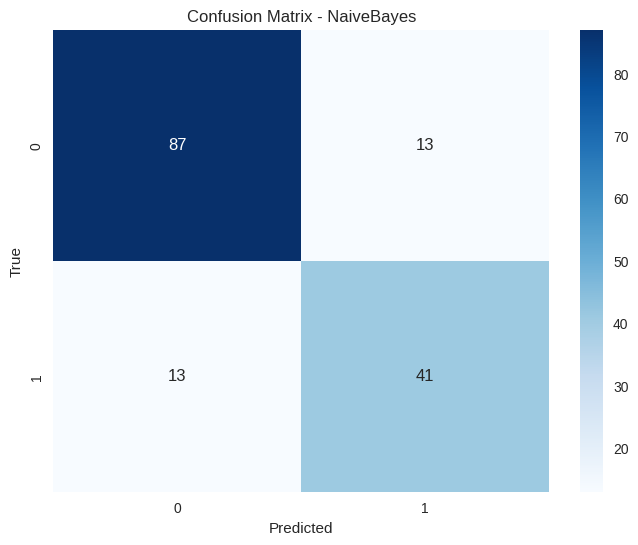

In [ ]:
print("Model Accuracy: ", accuracy_score(y_test, pred3))
print(classification_report(y_test, pred3))

cm = confusion_matrix(y_test, pred3)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - NaiveBayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [ ]:
cali_top5 = []
for model in top5:
    cali_model = calibrate_model(model)
    cali_top5.append(cali_model)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,11:32:13
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Logistic Regression


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6296,0.6692,0.3684,0.4667,0.4118,0.1469,0.1491
1,0.7407,0.8331,0.5789,0.6471,0.6111,0.4176,0.4190
2,0.7222,0.8331,0.5263,0.6250,0.5714,0.3682,0.3711
3,0.7778,0.8842,0.6316,0.7059,0.6667,0.5008,0.5025
4,0.7593,0.7850,0.6316,0.6667,0.6486,0.4658,0.4661
5,0.7407,0.8165,0.4211,0.7273,0.5333,0.3710,0.3976
6,0.8333,0.8872,0.5789,0.9167,0.7097,0.6010,0.6322
7,0.7925,0.8619,0.5556,0.7692,0.6452,0.5038,0.5172
8,0.7925,0.8381,0.6111,0.7333,0.6667,0.5178,0.5223


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6667,0.7293,0.3158,0.5455,0.4000,0.1913,0.2050
1,0.7593,0.8737,0.3684,0.8750,0.5185,0.3917,0.4569
2,0.7963,0.8481,0.4737,0.9000,0.6207,0.4992,0.5472
3,0.7963,0.8842,0.5263,0.8333,0.6452,0.5123,0.5389
4,0.7778,0.8120,0.5789,0.7333,0.6471,0.4882,0.4954
5,0.7407,0.8511,0.4211,0.7273,0.5333,0.3710,0.3976
6,0.8148,0.8827,0.5263,0.9091,0.6667,0.5507,0.5902
7,0.7736,0.8048,0.4444,0.8000,0.5714,0.4342,0.4688
8,0.7358,0.8508,0.2222,1.0000,0.3636,0.2740,0.3984


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6667,0.6647,0.5263,0.5263,0.5263,0.2692,0.2692
1,0.7593,0.8692,0.6316,0.6667,0.6486,0.4658,0.4661
2,0.7222,0.8150,0.5263,0.6250,0.5714,0.3682,0.3711
3,0.7778,0.8827,0.5789,0.7333,0.6471,0.4882,0.4954
4,0.7593,0.7865,0.5789,0.6875,0.6286,0.4524,0.4561
5,0.7037,0.8451,0.4211,0.6154,0.5000,0.2998,0.3107
6,0.8333,0.9143,0.6842,0.8125,0.7429,0.6209,0.6259
7,0.7736,0.8302,0.5000,0.7500,0.6000,0.4508,0.4688
8,0.7736,0.8365,0.5000,0.7500,0.6000,0.4508,0.4688


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6481,0.6677,0.4737,0.5000,0.4865,0.2192,0.2194
1,0.7593,0.8767,0.6316,0.6667,0.6486,0.4658,0.4661
2,0.7222,0.8135,0.5263,0.6250,0.5714,0.3682,0.3711
3,0.7778,0.8782,0.5789,0.7333,0.6471,0.4882,0.4954
4,0.7593,0.7865,0.5789,0.6875,0.6286,0.4524,0.4561
5,0.7222,0.8331,0.4211,0.6667,0.5161,0.3350,0.3524
6,0.8889,0.9158,0.7368,0.9333,0.8235,0.7441,0.7551
7,0.7736,0.8206,0.5000,0.7500,0.6000,0.4508,0.4688
8,0.7925,0.8397,0.4444,0.8889,0.5926,0.4734,0.5245


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5741,0.6286,0.3684,0.3889,0.3784,0.0548,0.0548
1,0.7407,0.8286,0.6842,0.6190,0.6500,0.4449,0.4463
2,0.7037,0.8015,0.4737,0.6000,0.5294,0.3175,0.3223
3,0.7963,0.8992,0.6842,0.7222,0.7027,0.5479,0.5484
4,0.7037,0.7654,0.5789,0.5789,0.5789,0.3504,0.3504
5,0.7963,0.8586,0.5789,0.7857,0.6667,0.5248,0.5375
6,0.8148,0.8421,0.5263,0.9091,0.6667,0.5507,0.5902
7,0.7358,0.8238,0.5000,0.6429,0.5625,0.3775,0.3836
8,0.8302,0.8746,0.6667,0.8000,0.7273,0.6055,0.6108


In [ ]:
cali_model = blend_models(estimator_list = cali_top5, method = 'hard', optimize = 'AUC')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6296,0.0000,0.4211,0.4706,0.4444,0.1680,0.1685
1,0.7778,0.0000,0.6316,0.7059,0.6667,0.5008,0.5025
2,0.7593,0.0000,0.5263,0.7143,0.6061,0.4384,0.4490
3,0.7778,0.0000,0.5789,0.7333,0.6471,0.4882,0.4954
4,0.7593,0.0000,0.5789,0.6875,0.6286,0.4524,0.4561
5,0.7407,0.0000,0.4211,0.7273,0.5333,0.3710,0.3976
6,0.8519,0.0000,0.5789,1.0000,0.7333,0.6406,0.6865
7,0.7736,0.0000,0.4444,0.8000,0.5714,0.4342,0.4688
8,0.8302,0.0000,0.5556,0.9091,0.6897,0.5819,0.6154


In [ ]:
final_model = finalize_model(cali_model)

In [ ]:
import joblib
joblib.dump(final_model, 'final_model.pkl')

['final_model.pkl']

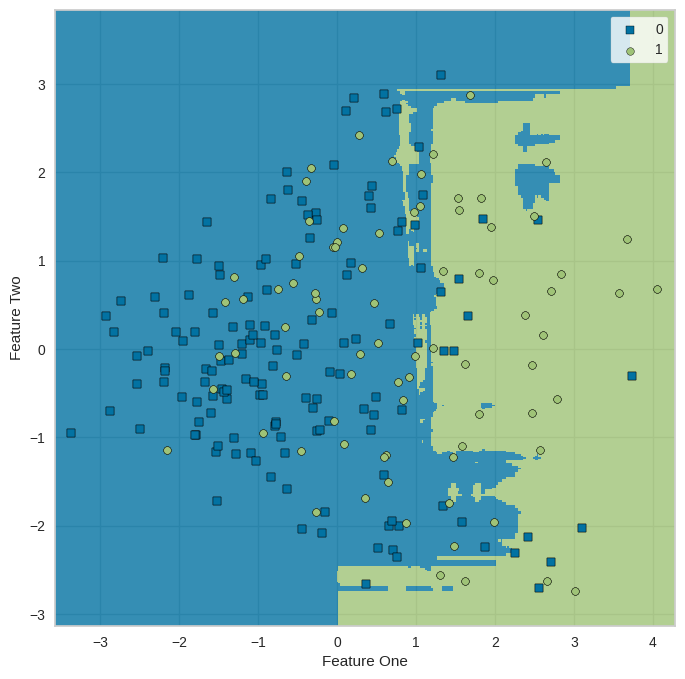

In [ ]:
plt.figure(figsize=(8, 8))
plot_model(final_model, plot='boundary')

In [ ]:
pred = final_model.predict(X_test)

final_model = confusion_matrix( y_test, pred)
accuracy = accuracy_score(y_test , pred)
precision = precision_score(y_test , pred)
recall = recall_score(y_test , pred)
f1 = f1_score(y_test,pred) 
print('accuracy: {0:.4f}, precision: {1:.4f}, recall: {2:.4f},\
F1: {3:.4f}'.format(accuracy, precision, recall, f1))

accuracy: 0.8442, precision: 0.8947, recall: 0.6296,F1: 0.7391


Model Accuracy:  0.8441558441558441
              precision    recall  f1-score   support

           0       0.83      0.96      0.89       100
           1       0.89      0.63      0.74        54

    accuracy                           0.84       154
   macro avg       0.86      0.79      0.81       154
weighted avg       0.85      0.84      0.84       154



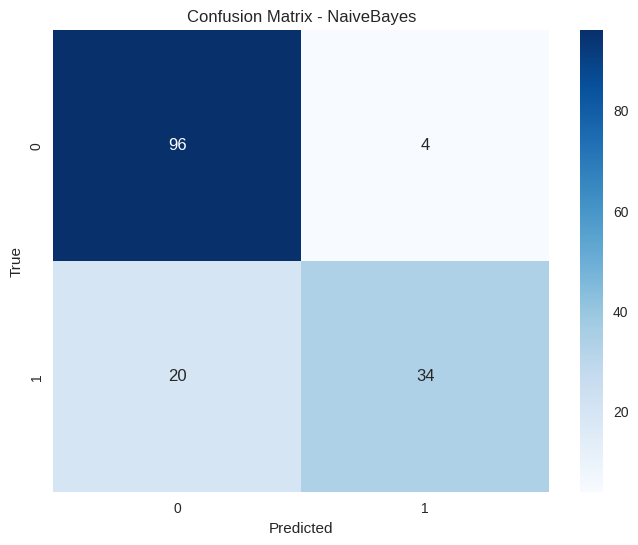

In [ ]:
print("Model Accuracy: ", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

cm = confusion_matrix(y_test, pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - NaiveBayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


### 补充 深度学习

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, scale
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.layers import LeakyReLU, ELU
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2


In [ ]:
scaler_choice = "minmax"  # "standard", "minmax", "robust"

if scaler_choice == "standard":
    scaler = StandardScaler()
elif scaler_choice == "minmax":
    scaler = MinMaxScaler()
elif scaler_choice == "robust":
    scaler = RobustScaler()

X_scaled = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.33, random_state=42)
y_train = to_categorical(y_train)

In [ ]:
layer_1_units = 16  
layer_2_units = 8  
output_units = 2     

activation_function_hidden = "tanh"  # "relu", "tanh", "leakyrelu", "elu"
activation_function_output = "softmax"  # "sigmoid", "softmax"

l2_lambda = 0.01

if activation_function_hidden == "relu":
    hidden_activation = "relu"
elif activation_function_hidden == "tanh":
    hidden_activation = "tanh"
elif activation_function_hidden == "leakyrelu":
    hidden_activation = LeakyReLU(alpha=0.1)  # LeakyReLU with slope of 0.1
elif activation_function_hidden == "elu":
    hidden_activation = "elu"

if activation_function_output == "sigmoid":
    output_activation = "sigmoid"
elif activation_function_output == "softmax":
    output_activation = "softmax"

model = Sequential()
model.add(Dense(layer_1_units, input_dim=8, activation=hidden_activation, kernel_regularizer=l2(l2_lambda)))
model.add(BatchNormalization()) 
model.add(Dense(layer_2_units, activation=hidden_activation, kernel_regularizer=l2(l2_lambda)))
model.add(BatchNormalization()) 
model.add(Dense(output_units, activation=output_activation))


I0000 00:00:1732678471.613581 1938246 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22341 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:04:00.0, compute capability: 8.6
I0000 00:00:1732678471.616697 1938246 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22341 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:05:00.0, compute capability: 8.6
I0000 00:00:1732678471.619458 1938246 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 22341 MB memory:  -> device: 2, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:08:00.0, compute capability: 8.6
I0000 00:00:1732678471.622158 1938246 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 22341 MB memory:  -> device: 3, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:09:00.0, compute capability: 8.6
I0000 00:00:1732678471.624874 1938246 gpu_device.cc:2022

In [ ]:
optimizer_choice = "adam"  # "adam", "sgd", "rmsprop"
learning_rate = 0.001  # 常见的学习率范围：0.0001 到 0.01

if optimizer_choice == "adam":
    optimizer = Adam(learning_rate=learning_rate)
elif optimizer_choice == "sgd":
    optimizer = SGD(learning_rate=learning_rate)
elif optimizer_choice == "rmsprop":
    optimizer = RMSprop(learning_rate=learning_rate)

model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])


In [ ]:
epochs = 150  # 范围：50 到 200
batch_size = 32  # 范围：16 到 128

early_stopping = EarlyStopping(monitor='val_loss', patience=10)  # patience 范围是 5 到 20

validation_split = 0.33  # 范围：0.1 到 0.3

history = model.fit(X_train, y_train, validation_split=validation_split, epochs=epochs, batch_size=batch_size)


Epoch 1/150


I0000 00:00:1732678475.027693 1996233 service.cc:148] XLA service 0x7aa764004ef0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732678475.027721 1996233 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1732678475.027726 1996233 service.cc:156]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1732678475.027729 1996233 service.cc:156]   StreamExecutor device (2): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1732678475.027731 1996233 service.cc:156]   StreamExecutor device (3): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1732678475.027734 1996233 service.cc:156]   StreamExecutor device (4): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1732678475.027737 1996233 service.cc:156]   StreamExecutor device (5): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1732678475.027740 1996233 service

 5/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4798 - loss: 1.0618

I0000 00:00:1732678476.867195 1996233 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 297ms/step - accuracy: 0.4550 - loss: 1.0727 - val_accuracy: 0.6353 - val_loss: 0.8855
Epoch 2/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5270 - loss: 0.9954 - val_accuracy: 0.6353 - val_loss: 0.8853
Epoch 3/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5429 - loss: 0.9359 - val_accuracy: 0.5882 - val_loss: 0.8869
Epoch 4/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5864 - loss: 0.9086 - val_accuracy: 0.5529 - val_loss: 0.8877
Epoch 5/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6341 - loss: 0.8578 - val_accuracy: 0.5647 - val_loss: 0.8833
Epoch 6/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7110 - loss: 0.7996 - val_accuracy: 0.5471 - val_loss: 0.8823
Epoch 7/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7582 - loss: 0.7540 - val_accuracy: 0.5471 - val_loss: 0.8798
Epoch 8/150
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7304 - loss: 0.7541 - val_accuracy: 0.5529 - val_

In [ ]:
_, accuracy = model.evaluate(X_train, y_train)
print('Accuracy: %.2f' % (accuracy*100))

predictions = np.argmax(model.predict(X_test), axis=-1)
for i in range(10):
    print('%s => %d (expected %d)' % (X_test[i].tolist(), predictions[i], y[i]))

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.8250 - loss: 0.4303
Accuracy: 79.18
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step
[0.4444444444444444, 0.3760617760617761, 0.31944444444444436, 0.6161821884836141, 0.9543134306229217, 0.4929797191887675, 0.3137254901960785, 0.4835164835164836] => 0 (expected 1)
[0.14814814814814814, 0.4625482625482626, 0.5555555555555554, 0.5924828735419367, 0.35678026532240414, 0.546021840873635, 0.062388591800356524, 0.0] => 0 (expected 0)
[0.14814814814814814, 0.43783783783783786, 0.40277777777777773, 0.3208047892365611, 0.35678026532240414, 0.3931357254290172, 0.07130124777183602, 0.0] => 0 (expected 1)
[0.5925925925925926, 0.43166023166023165, 0.625, 0.3208047892365611, 0.35678026532240414, 0.1996879875195008, 0.6934046345811051, 0.2857142857142857] => 0 (expected 0)
[0.5185185185185185, 0.6108108108108108, 0.7638888888888888, 0.3208047892365611, 0.35678026532240414, 0.36505460218408725, 0.11764705882352941, 0.6373626373626374] => 0 (expected 1)
[0.444

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Model Accuracy:  0.7204724409448819
              precision    recall  f1-score   support

           0       0.80      0.77      0.78       168
           1       0.58      0.63      0.60        86

    accuracy                           0.72       254
   macro avg       0.69      0.70      0.69       254
weighted avg       0.73      0.72      0.72       254



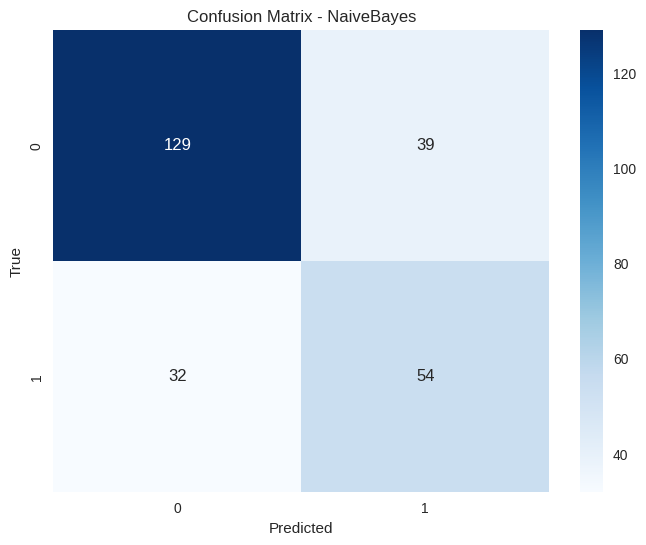

In [ ]:
y_pred = model.predict(X_test)

y_pred = np.argmax(y_pred, axis=1) 


print("Model Accuracy: ", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - NaiveBayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


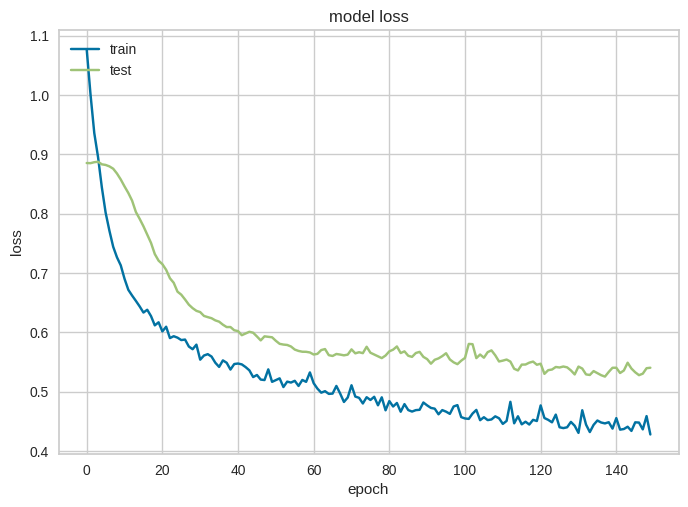

In [ ]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

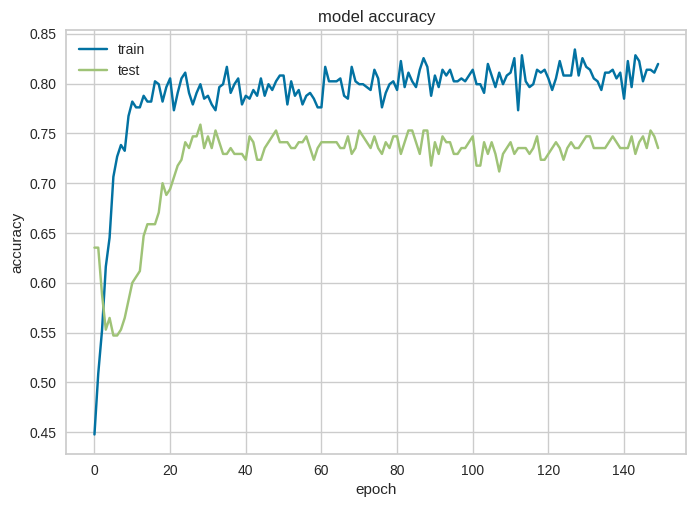

In [ ]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()